# Machine Learning - Final Project
## Ali Khoramfar - Zahra Feizolahzadeh - Zeinab Yazdani

# Import Packages

In [1]:
import os
import zipfile
import scipy.io as sio
import numpy as np
from scipy.signal import butter, filtfilt, welch
from scipy.spatial import Delaunay
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA
from sklearn.manifold import TSNE
import pywt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score
from mne.decoding import CSP
from sklearn.covariance import OAS
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Set flags

# for standaization
std     = True # True or False

# for dimentionality reduction
preproc = None # 'ica' or 'pca' or None
n_dr    = 10 # number of features after dimentionality reduction [10, 30]

# for feature extraction
n_csp   = 40 # number of features after feature extraction [4, 8, 10, 20, 40]

# Dataset

## Download and Extract the Dataset

In [3]:
dataset_dir = '/kaggle/working/BCI_Dataset'
os.makedirs(dataset_dir, exist_ok=True)
!wget -O {dataset_dir}/BCICIV_1_mat.zip https://www.bbci.de/competition/download/competition_iv/BCICIV_1_mat.zip

with zipfile.ZipFile(f"{dataset_dir}/BCICIV_1_mat.zip", 'r') as zip_ref:
    zip_ref.extractall(dataset_dir)

--2024-07-14 14:49:07--  https://www.bbci.de/competition/download/competition_iv/BCICIV_1_mat.zip
Resolving www.bbci.de (www.bbci.de)... 130.149.80.149
Connecting to www.bbci.de (www.bbci.de)|130.149.80.149|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252211988 (241M) [application/zip]
Saving to: '/kaggle/working/BCI_Dataset/BCICIV_1_mat.zip'

/kaggle/working/BCI 100%[===================>] 240.53M  29.7MB/s    in 8.7s    

2024-07-14 14:49:16 (27.6 MB/s) - '/kaggle/working/BCI_Dataset/BCICIV_1_mat.zip' saved [252211988/252211988]



### List extracted files

In [4]:
extracted_files = os.listdir(dataset_dir)
print(extracted_files)

['BCICIV_calib_ds1d.mat', 'BCICIV_calib_ds1g.mat', 'BCICIV_eval_ds1e.mat', 'BCICIV_eval_ds1f.mat', 'BCICIV_eval_ds1d.mat', 'BCICIV_eval_ds1g.mat', 'BCICIV_1_mat.zip', 'BCICIV_calib_ds1c.mat', 'BCICIV_eval_ds1b.mat', 'BCICIV_eval_ds1a.mat', 'BCICIV_calib_ds1a.mat', 'BCICIV_calib_ds1e.mat', 'BCICIV_calib_ds1b.mat', 'BCICIV_eval_ds1c.mat', 'BCICIV_calib_ds1f.mat']


## Import Dataset from Input

In [5]:
class EEGDataLoader:
    def __init__(self, path:str) -> None:
        self.mat = sio.loadmat(path)

        # Extract continuous EEG signals
        self.cnt = self.mat['cnt']
        # Convert to microvolts
        self.cnt = 0.1 * self.cnt.astype(np.float64)

        # Extract marker information
        # Positions of the markers
        self.positions = self.mat['mrk']['pos'][0][0][0]
        # Target classes (-1 for class one, 1 for class two)
        self.labels    = self.mat['mrk']['y'][0][0][0]


        # Extract additional information
        # sampling frequency
        self.fs   = self.mat['nfo']['fs'][0, 0][0, 0]
        # Channel labels
        self.channel_labels = [clab[0] for clab in self.mat['nfo']['clab'][0][0][0]]
        # Names of the motor imagery classes
        self.classes = [cls[0] for cls in self.mat['nfo']['classes'][0][0][0]]
        # x positions of the electrodes in a 2D projection
        self.xpos = self.mat['nfo']['xpos'][0, 0]
        # y positions of the electrodes in a 2D projection
        self.ypos = self.mat['nfo']['ypos'][0, 0]


### Load Calibration File 1

In [6]:
path1 = r'/kaggle/working/BCI_Dataset/BCICIV_calib_ds1a.mat'
data1 = EEGDataLoader(path1)


# Print some information
print(f"{path1.split('/')[-1]}:")
print(f"EEG data shape:       {data1.cnt.shape}")
print(f"Target classes shape: {data1.labels.shape}")
print(f"Positions Shape:      {data1.positions.shape}")
print(f"Sampling rate:        {data1.fs} Hz")
print(f"Classes:              {data1.classes}")
print(f"Channel labels:       {data1.channel_labels}")

BCICIV_calib_ds1a.mat:
EEG data shape:       (190594, 59)
Target classes shape: (200,)
Positions Shape:      (200,)
Sampling rate:        100 Hz
Classes:              ['left', 'foot']
Channel labels:       ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'CFC7', 'CFC5', 'CFC3', 'CFC1', 'CFC2', 'CFC4', 'CFC6', 'CFC8', 'T7', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'T8', 'CCP7', 'CCP5', 'CCP3', 'CCP1', 'CCP2', 'CCP4', 'CCP6', 'CCP8', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'PO1', 'PO2', 'O1', 'O2']


 ### Load Second Calibration File 2

In [7]:
path2 = r'/kaggle/working/BCI_Dataset/BCICIV_calib_ds1b.mat'
data2 = EEGDataLoader(path2)


# Print some information
print(f"{path2.split('/')[-1]}:")
print(f"EEG data shape:       {data2.cnt.shape}")
print(f"Target classes shape: {data2.labels.shape}")
print(f"Positions Shape:      {data2.positions.shape}")
print(f"Sampling rate:        {data2.fs} Hz")
print(f"Classes:              {data2.classes}")
print(f"Channel labels:       {data2.channel_labels}")

BCICIV_calib_ds1b.mat:
EEG data shape:       (190594, 59)
Target classes shape: (200,)
Positions Shape:      (200,)
Sampling rate:        100 Hz
Classes:              ['left', 'right']
Channel labels:       ['AF3', 'AF4', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'CFC7', 'CFC5', 'CFC3', 'CFC1', 'CFC2', 'CFC4', 'CFC6', 'CFC8', 'T7', 'C5', 'C3', 'C1', 'Cz', 'C2', 'C4', 'C6', 'T8', 'CCP7', 'CCP5', 'CCP3', 'CCP1', 'CCP2', 'CCP4', 'CCP6', 'CCP8', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'PO1', 'PO2', 'O1', 'O2']


# Preprocessing and Feature Extraction

## 1. Load Data
Already loaded in previous steps.

## EDA 

###  Plot EEG signals - first 5 channels anf 5 windows

### Calibration File 1

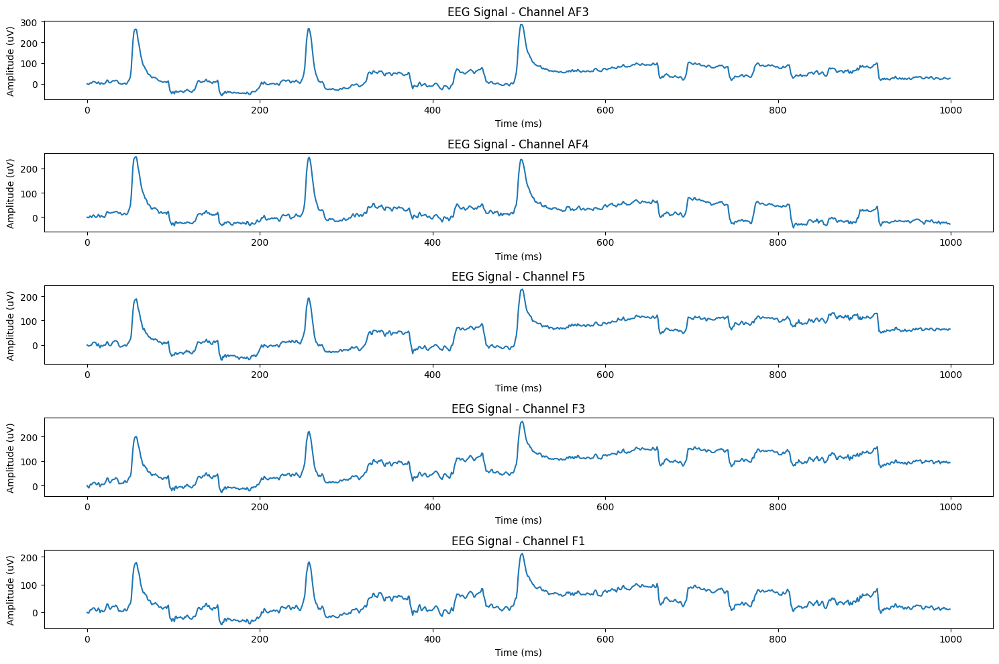

In [8]:
 # Plotting the first 10s of the 5 first channels
plt.figure(figsize=(15, 10))
seconds_to_plot = 10
samples_to_plot = seconds_to_plot * int(data1.fs)
for i in range(5):  
    plt.subplot(5, 1, i+1)
    plt.plot(np.arange(samples_to_plot), data1.cnt[:samples_to_plot, i])
    plt.title(f'EEG Signal - Channel {data1.channel_labels[i]}')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
plt.tight_layout()
plt.show()


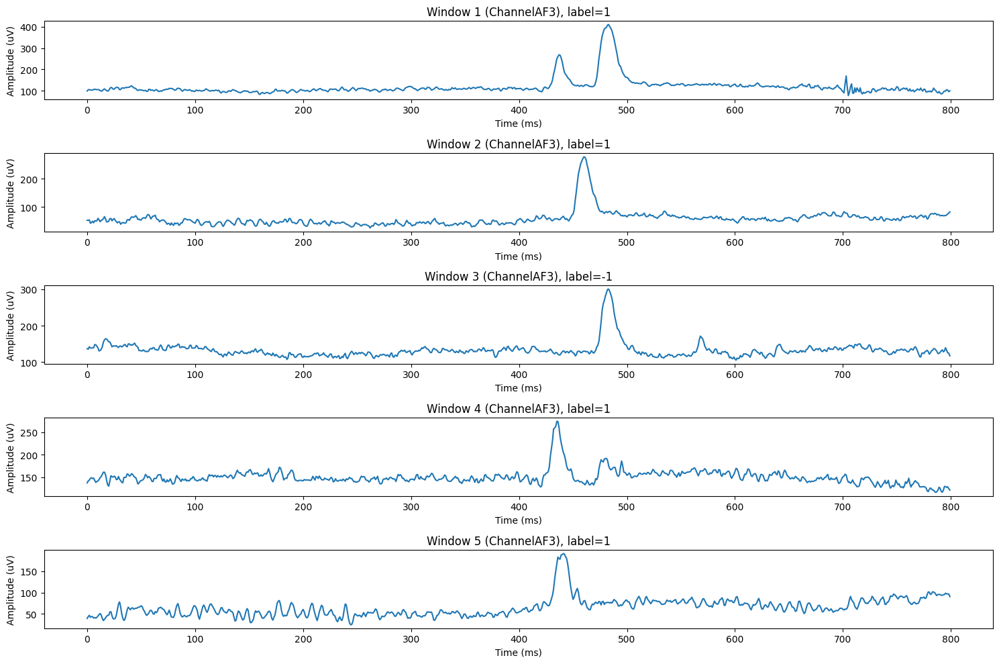

In [9]:
# Plotting the first channel of the 5 first windows
plt.figure(figsize=(15, 10))
for i in range(5):  
    plt.subplot(5, 1, i+1)
    plt.plot(data1.cnt[data1.positions[i]:data1.positions[i+1], i])
    plt.title(f'Window {i+1} (Channel{data1.channel_labels[0]}), label={data1.labels[i]}')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
plt.tight_layout()
plt.show()


### Calibration File 2

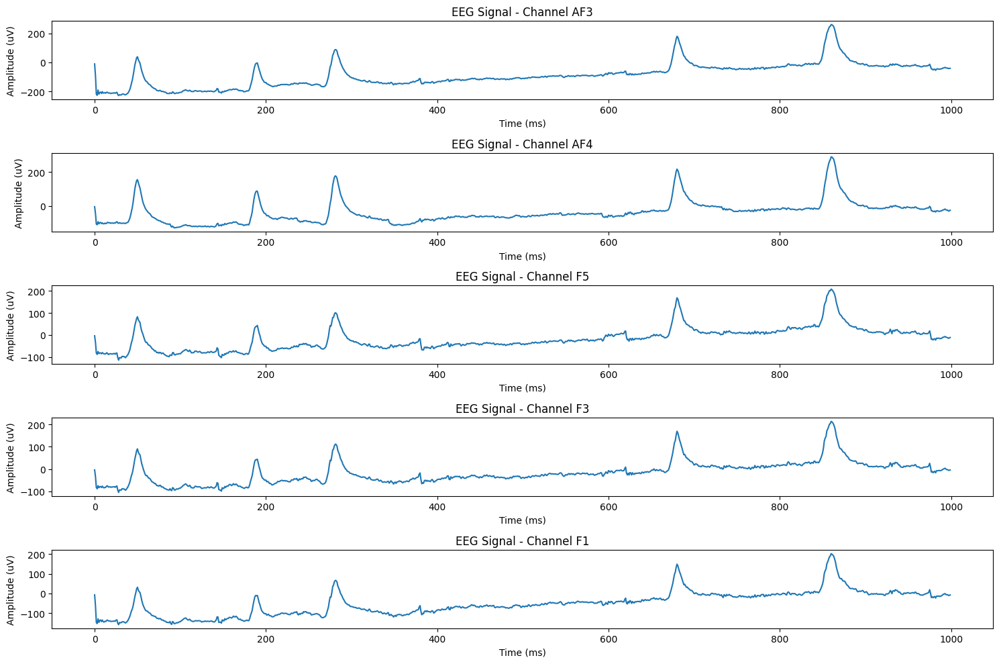

In [10]:
plt.figure(figsize=(15, 10))
seconds_to_plot = 10
samples_to_plot = seconds_to_plot * int(data2.fs)
for i in range(5):  
    plt.subplot(5, 1, i+1)
    plt.plot(np.arange(samples_to_plot), data2.cnt[:samples_to_plot, i])
    plt.title(f'EEG Signal - Channel {data2.channel_labels[i]}')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
plt.tight_layout()
plt.show()


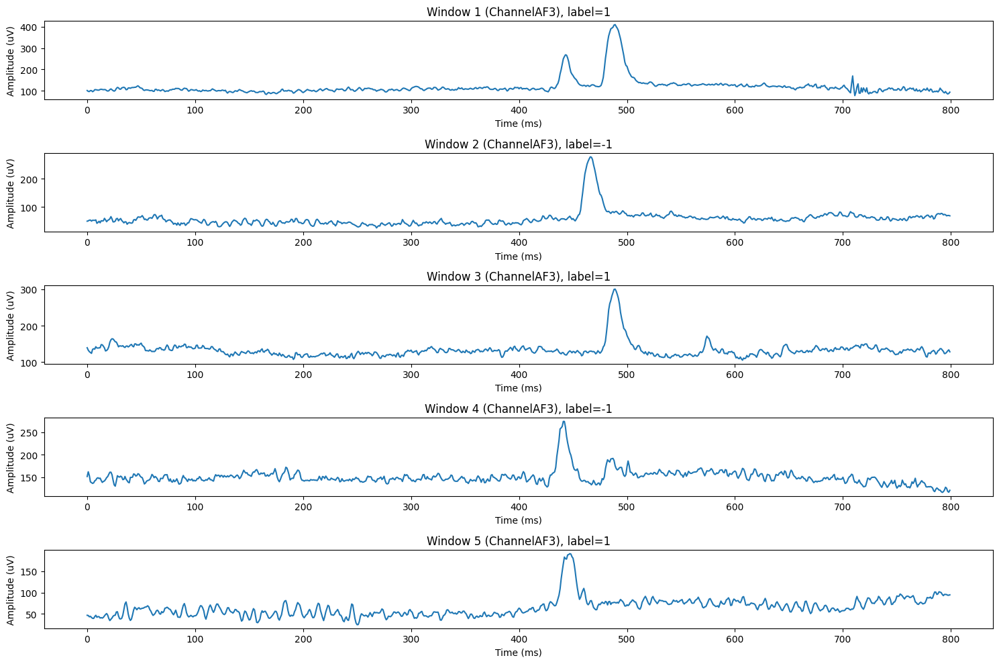

In [11]:
# Plotting the first channel of the 5 windows
plt.figure(figsize=(15, 10))
for i in range(5):  
    plt.subplot(5, 1, i+1)
    plt.plot(data1.cnt[data2.positions[i]:data2.positions[i+1], i])
    plt.title(f'Window {i+1} (Channel{data1.channel_labels[0]}), label={data2.labels[i]}')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
plt.tight_layout()
plt.show()


### Distribution of Labels

### Calibration File 1

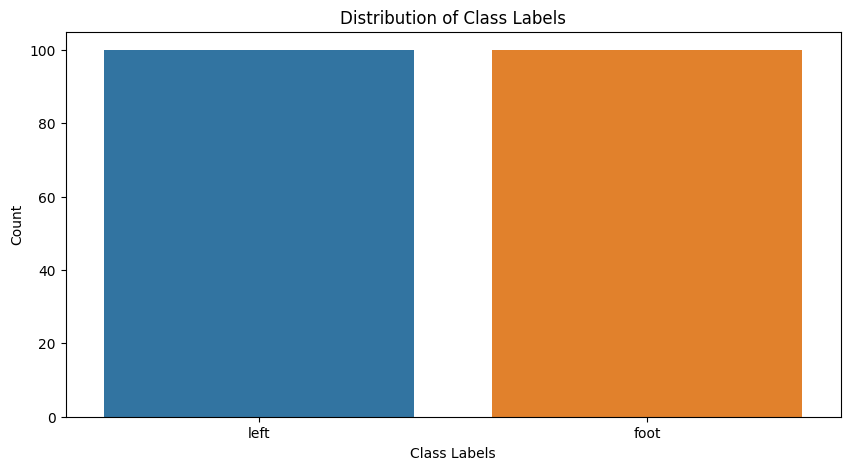

In [12]:
plt.figure(figsize=(10, 5))
sns.countplot(x=data1.labels)
plt.title('Distribution of Class Labels')
plt.xlabel('Class Labels')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=data1.classes)
plt.show()

### Calibration File 2

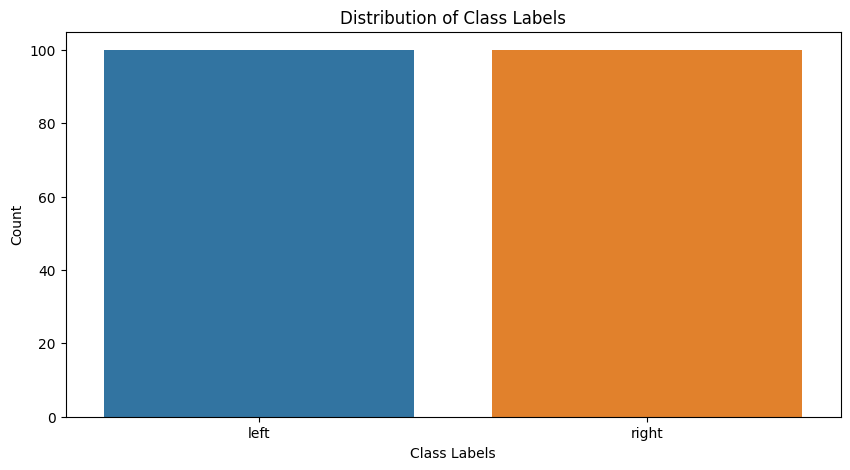

In [13]:
plt.figure(figsize=(10, 5))
sns.countplot(x=data2.labels)
plt.title('Distribution of Class Labels')
plt.xlabel('Class Labels')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=data2.classes)
plt.show()

### Channel-wise Mean and Variance

### Calibration File 1

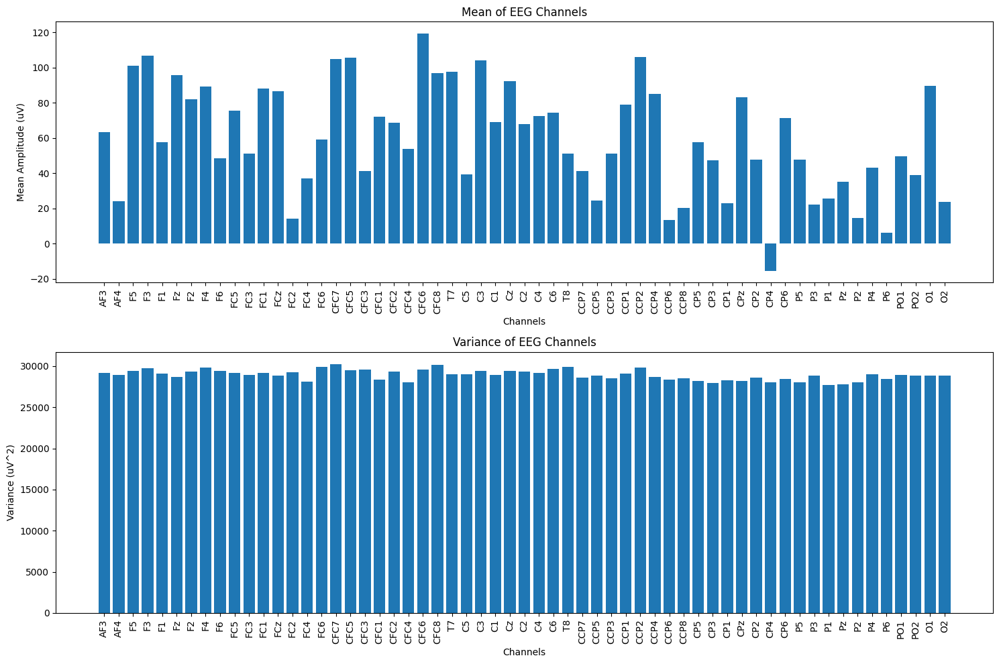

In [14]:
channel_means = np.mean(data1.cnt, axis=0)
channel_vars = np.var(data1.cnt, axis=0)

plt.figure(figsize=(15, 10))

plt.subplot(2, 1, 1)
plt.bar(data1.channel_labels, channel_means)
plt.title('Mean of EEG Channels')
plt.xlabel('Channels')
plt.ylabel('Mean Amplitude (uV)')
plt.xticks(rotation=90)

plt.subplot(2, 1, 2)
plt.bar(data2.channel_labels, channel_vars)
plt.title('Variance of EEG Channels')
plt.xlabel('Channels')
plt.ylabel('Variance (uV^2)')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

### Calibration File 2

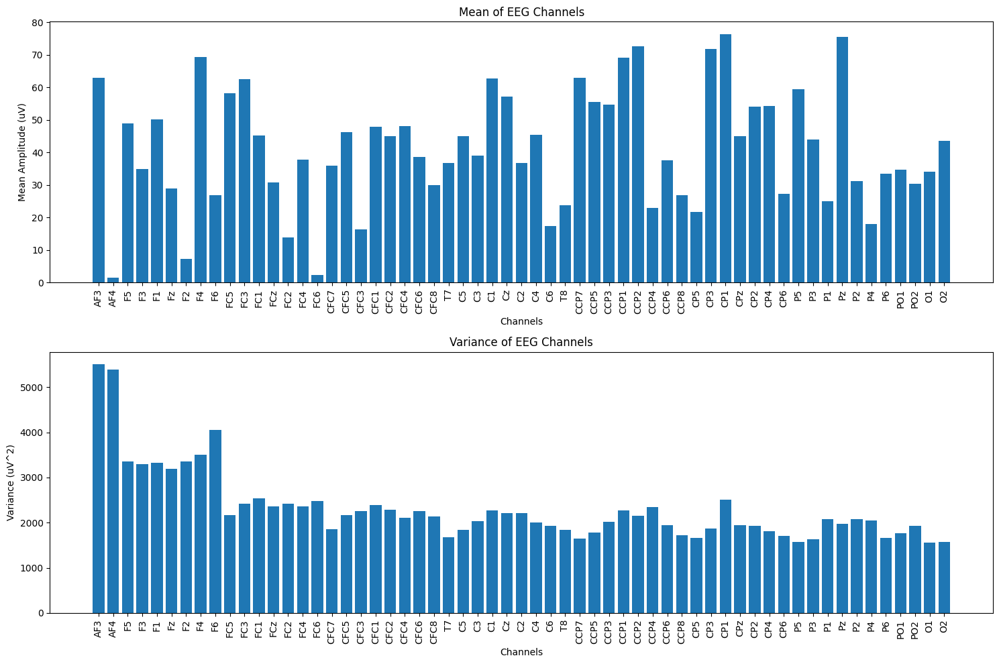

In [15]:
channel_means2 = np.mean(data2.cnt, axis=0)
channel_vars2 = np.var(data2.cnt, axis=0)

plt.figure(figsize=(15, 10))

plt.subplot(2, 1, 1)
plt.bar(data2.channel_labels, channel_means2)
plt.title('Mean of EEG Channels')
plt.xlabel('Channels')
plt.ylabel('Mean Amplitude (uV)')
plt.xticks(rotation=90)

plt.subplot(2, 1, 2)
plt.bar(data2.channel_labels, channel_vars2)
plt.title('Variance of EEG Channels')
plt.xlabel('Channels')
plt.ylabel('Variance (uV^2)')
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

## 2.Apply Bandpass Filters
We will apply a bandpass filter to isolate the beta and mu frequency bands (8-30 Hz) using a 3rd-order Butterworth filter.

In [16]:
def butter_bandpass(lowcut, highcut, fs, order=3):
    """Create filter."""
    nyquist = 0.5 * fs
    low  = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return b, a


def bandpass_filter(data, lowcut, highcut, fs, order=3):
    """Apply filter."""
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b, a, data, axis=0)
    return y

In [17]:
# Parameters 
lowcut  = 8.0
highcut = 30.0

# Band Pass Filtering
filtered_eeg_data1 = bandpass_filter(data1.cnt, lowcut, highcut, data1.fs)
filtered_eeg_data2 = bandpass_filter(data2.cnt, lowcut, highcut, data2.fs)

print(f"Filtered EEG Data Shape for Calibration File 1: {filtered_eeg_data1.shape}")
print(f"Filtered EEG Data Shape for Calibration File 2: {filtered_eeg_data2.shape}")

Filtered EEG Data Shape for Calibration File 1: (190594, 59)
Filtered EEG Data Shape for Calibration File 2: (190594, 59)


### Plot Before / After Band Pass Filtering

In [18]:
def plot_filtered_data(original_data, filtered_data, positions, file_label):
    plt.figure(figsize=(14, 10))
    for i in range(5): # Plot for 5 channels
        plt.subplot(5, 2, 2*i + 1)
        plt.plot(original_data[positions[i]:positions[i+1], 0])
        plt.title(f'Original EEG Data (Channel 1) - Window {i+1} ({file_label})')
        plt.xlabel('Time (ms)')
        plt.ylabel('Amplitude (uV)')
        
        plt.subplot(5, 2, 2*i + 2)
        plt.plot(filtered_data[positions[i]:positions[i+1], 0])
        plt.title(f'Filtered EEG Data (channel 1) - Window {i+1} ({file_label})')
        plt.xlabel('Time (ms)')
        plt.ylabel('Amplitude (uV)')
    plt.tight_layout()
    plt.show()
    
def plot_psd(data, fs, title):
    f, Pxx = welch(data, fs, nperseg=1024)
    plt.semilogy(f, Pxx)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power Spectral Density (uV^2/Hz)')
    plt.tight_layout()

### Calibration File 1

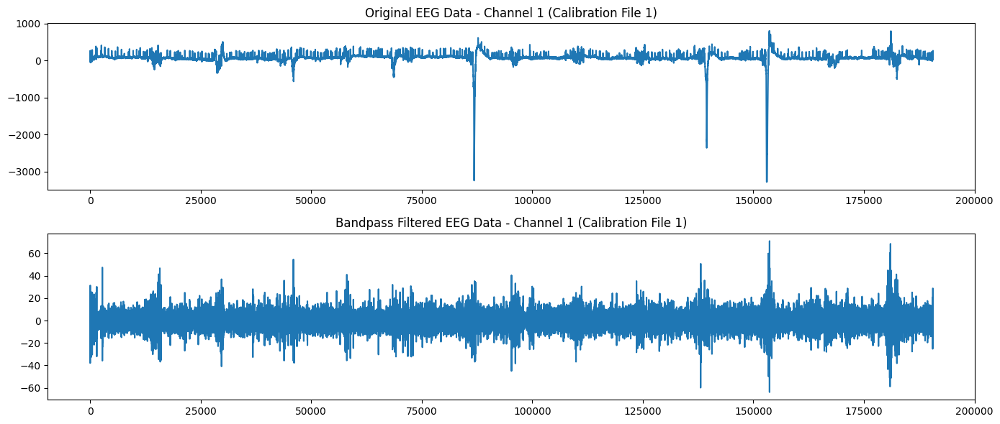

In [19]:
plt.figure(figsize=(14, 6))
plt.subplot(2, 1, 1)
plt.plot(data1.cnt[:, 0])
plt.title('Original EEG Data - Channel 1 (Calibration File 1)')
plt.subplot(2, 1, 2)
plt.plot(filtered_eeg_data1[:, 0])
plt.title('Bandpass Filtered EEG Data - Channel 1 (Calibration File 1)')
plt.tight_layout()
plt.show()

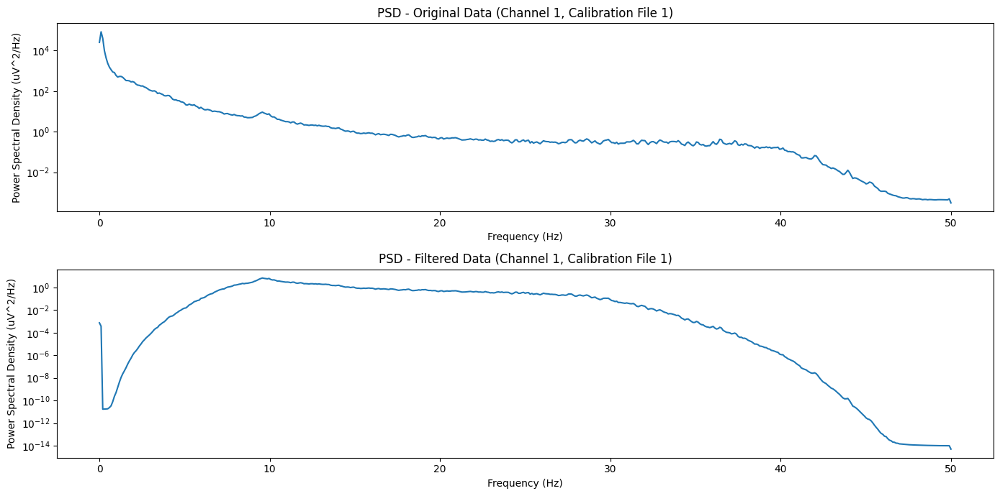

In [20]:
plt.figure(figsize=(14, 7))

plt.subplot(2, 1, 1)
plot_psd(data1.cnt[:, 0], data1.fs, 'PSD - Original Data (Channel 1, Calibration File 1)')
plt.subplot(2, 1, 2)
plot_psd(filtered_eeg_data1[:, 0], data1.fs, 'PSD - Filtered Data (Channel 1, Calibration File 1)')

plt.tight_layout()
plt.show()

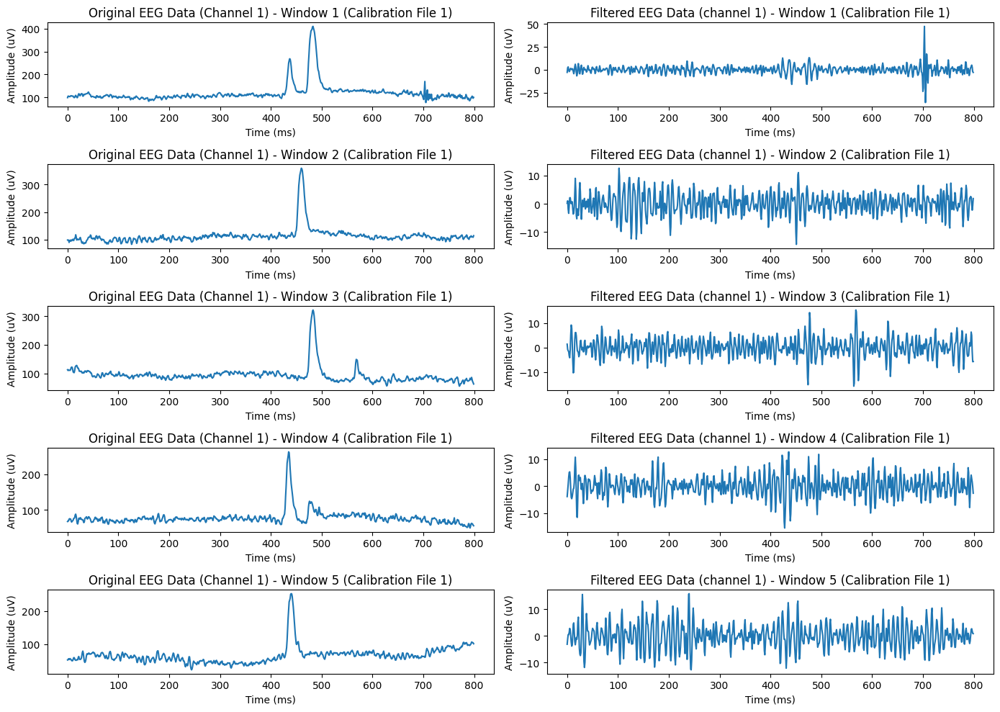

In [21]:
plot_filtered_data(data1.cnt, filtered_eeg_data1, data1.positions, 'Calibration File 1')

### Calibration File 2

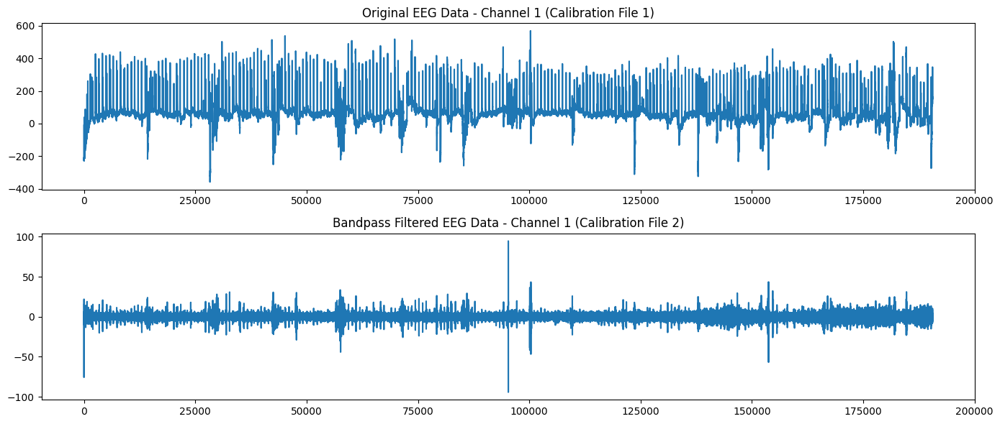

In [22]:
plt.figure(figsize=(14, 6))
plt.subplot(2, 1, 1)
plt.plot(data2.cnt[:, 0])
plt.title('Original EEG Data - Channel 1 (Calibration File 1)')
plt.subplot(2, 1, 2)
plt.plot(filtered_eeg_data2[:, 0])
plt.title('Bandpass Filtered EEG Data - Channel 1 (Calibration File 2)')
plt.tight_layout()
plt.show()

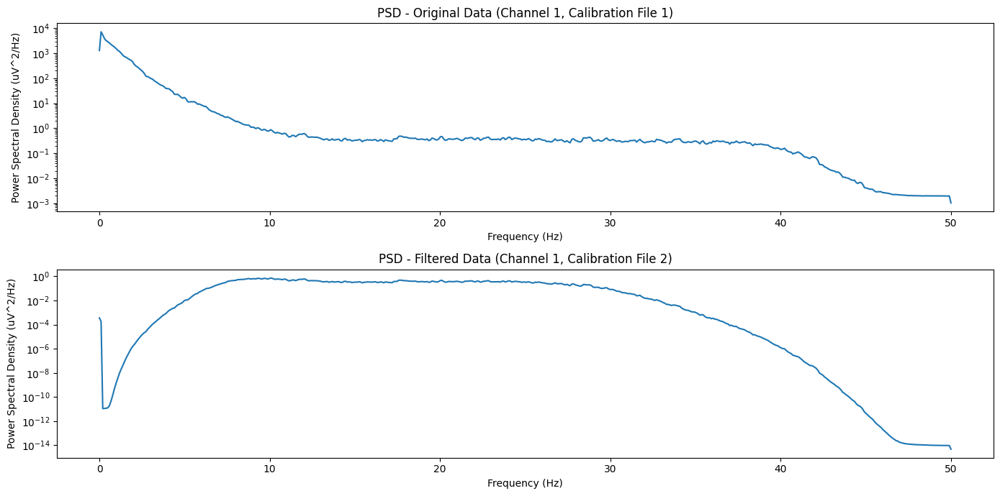

In [23]:
plt.figure(figsize=(14, 7))

plt.subplot(2, 1, 1)
plot_psd(data2.cnt[:, 0], data2.fs, 'PSD - Original Data (Channel 1, Calibration File 1)')
plt.subplot(2, 1, 2)
plot_psd(filtered_eeg_data2[:, 0], data2.fs, 'PSD - Filtered Data (Channel 1, Calibration File 2)')

plt.tight_layout()
plt.show()

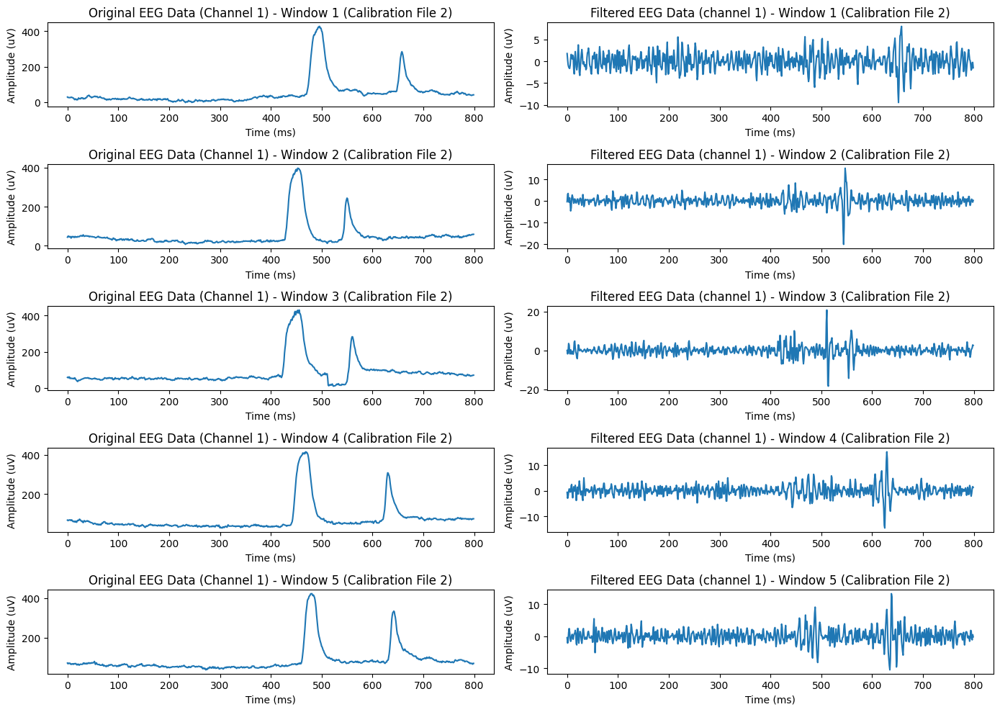

In [24]:
plot_filtered_data(data2.cnt, filtered_eeg_data2, data2.positions, 'Calibration File 2')

## 3.Spatial Filtering

### 3-1. Common Average Reference (CAR) Filter

In [25]:
def apply_car_filter(data):
    car_filtered_data = data - np.mean(data, axis=1, keepdims=True)
    return car_filtered_data

In [26]:
car_filtered_eeg_data1 = apply_car_filter(filtered_eeg_data1)
car_filtered_eeg_data2 = apply_car_filter(filtered_eeg_data2)

print(f"Filtered EEG Data Shape for Calibration File 1: {car_filtered_eeg_data1.shape}")
print(f"Filtered EEG Data Shape for Calibration File 2: {car_filtered_eeg_data2.shape}")

Filtered EEG Data Shape for Calibration File 1: (190594, 59)
Filtered EEG Data Shape for Calibration File 2: (190594, 59)


####  Plot before and after CAR filtering

#### Signal-to-Noise Ratio (SNR) Analysis

In [27]:
def compute_snr(data):
    signal_power = np.mean(data ** 2, axis=0)
    noise_power = np.var(data, axis=0)
    snr = 10 * np.log10(signal_power / noise_power)
    return snr

#### Variance Comparison

In [28]:
def plot_variance_comparison(original_data, car_filtered_data, file_label):
    variance_original = np.var(original_data, axis=0)
    variance_car = np.var(car_filtered_data, axis=0)
    
    plt.figure(figsize=(14, 6))
    plt.plot(variance_original, label='Bandpass Filtered')
    plt.plot(variance_car, label='CAR Filtered')
    plt.title(f'Variance Comparison ({file_label})')
    plt.xlabel('Channel')
    plt.ylabel('Variance')
    plt.legend()
    plt.show()    

#### Correlation Matrix Heatmap

In [29]:
def plot_correlation_matrix(data, title):
    corr_matrix = np.corrcoef(data.T)
    plt.figure(figsize=(14, 10))
    sns.heatmap(corr_matrix, xticklabels=data1.channel_labels, yticklabels=data1.channel_labels, cmap='coolwarm', center=0)
    plt.title(title)
    plt.show()

#### Calibration File 1

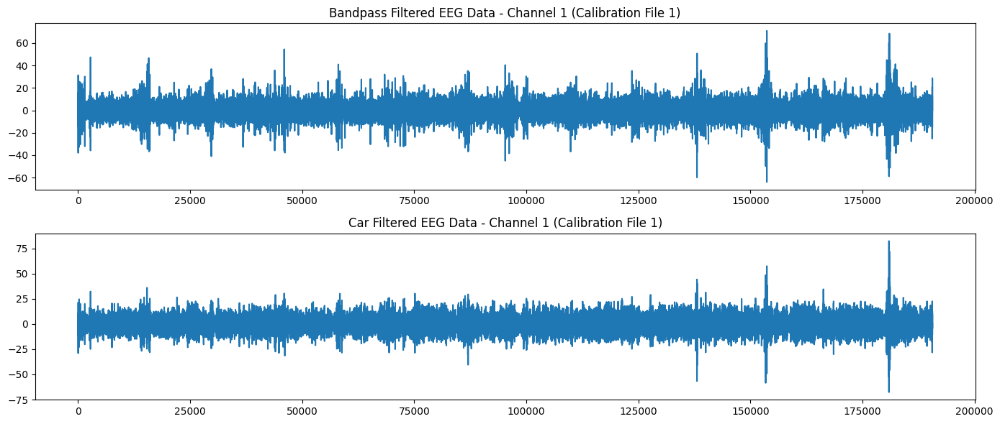

In [30]:
plt.figure(figsize=(14, 6))
plt.subplot(2, 1, 1)
plt.plot(filtered_eeg_data1[:, 0])
plt.title('Bandpass Filtered EEG Data - Channel 1 (Calibration File 1)')
plt.subplot(2, 1, 2)
plt.plot(car_filtered_eeg_data1[:, 0])
plt.title('Car Filtered EEG Data - Channel 1 (Calibration File 1)')
plt.tight_layout()
plt.show()

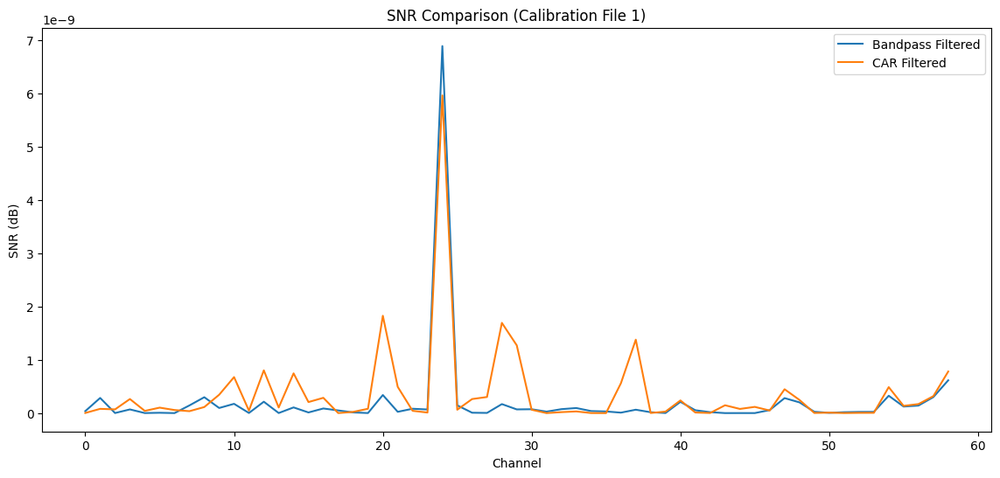

In [31]:
# Signal-to-Noise Ratio (SNR) Analysis
snr_before_car1 = compute_snr(filtered_eeg_data1)
snr_after_car1 = compute_snr(car_filtered_eeg_data1)

plt.figure(figsize=(14, 6))
plt.plot(snr_before_car1, label='Bandpass Filtered')
plt.plot(snr_after_car1, label='CAR Filtered')
plt.title('SNR Comparison (Calibration File 1)')
plt.xlabel('Channel')
plt.ylabel('SNR (dB)')
plt.legend()
plt.show()

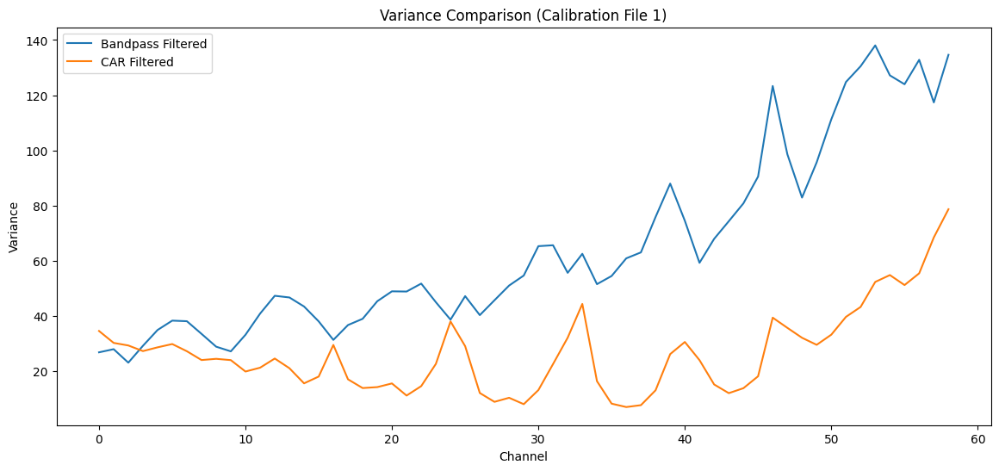

In [32]:
# Variance Comparison
plot_variance_comparison(filtered_eeg_data1, car_filtered_eeg_data1, 'Calibration File 1')

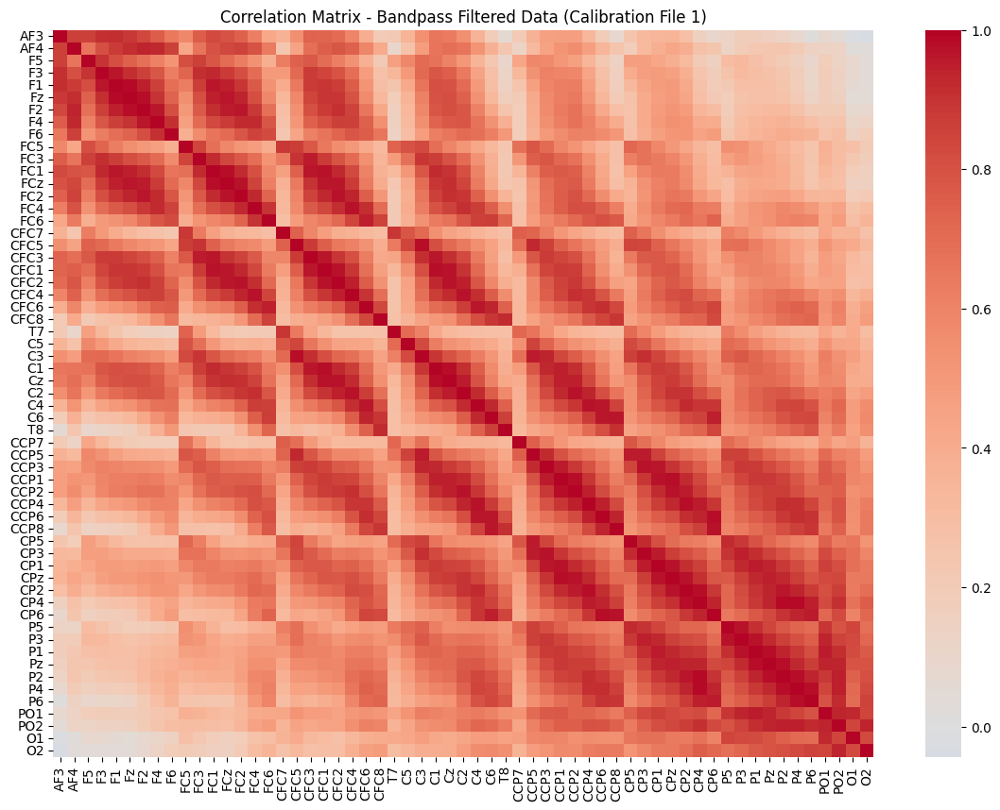

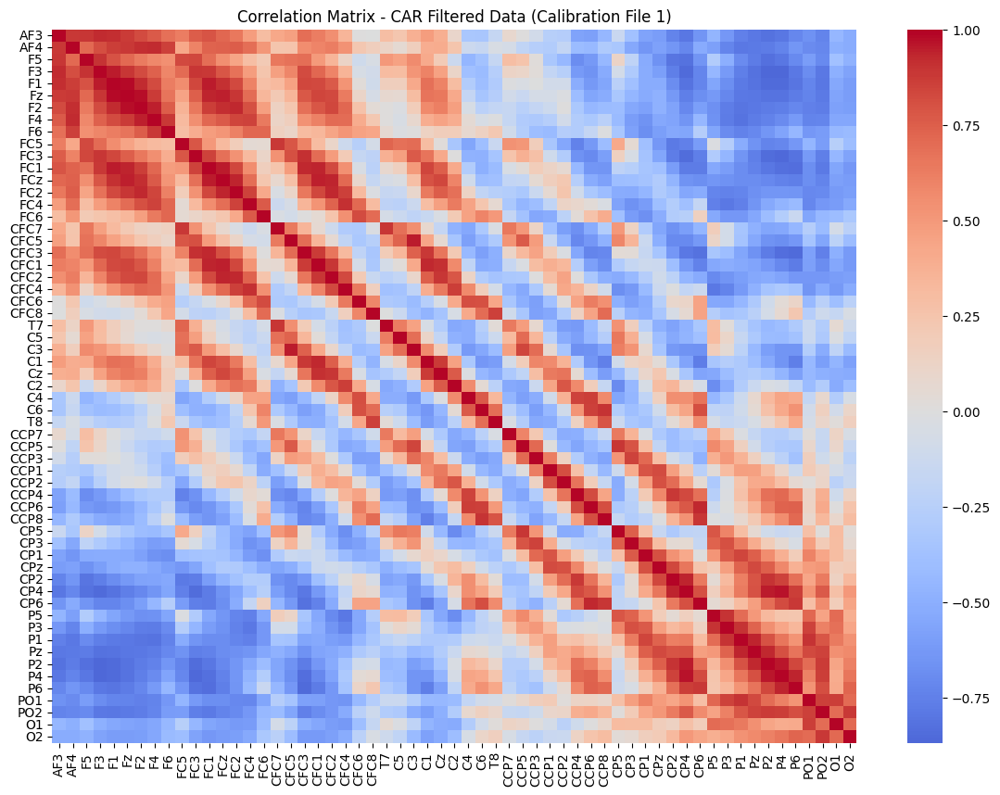

In [33]:
# Correlation Matrix Heatmap
plot_correlation_matrix(filtered_eeg_data1, 'Correlation Matrix - Bandpass Filtered Data (Calibration File 1)')
plot_correlation_matrix(car_filtered_eeg_data1, 'Correlation Matrix - CAR Filtered Data (Calibration File 1)')

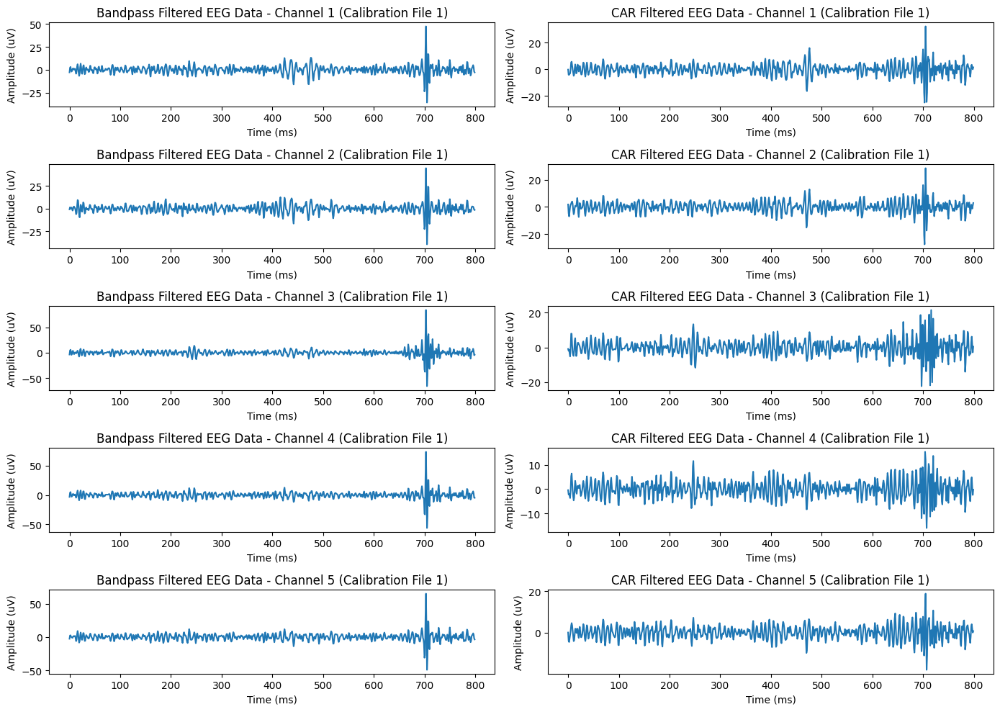

In [34]:
plt.figure(figsize=(14, 10))
channels_to_plot = 5
for i in range(channels_to_plot):
    plt.subplot(channels_to_plot, 2, 2*i + 1)
    plt.plot(filtered_eeg_data1[data1.positions[0]:data1.positions[1], i])
    plt.title(f'Bandpass Filtered EEG Data - Channel {i+1} (Calibration File 1)')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
    
    plt.subplot(channels_to_plot, 2, 2*i + 2)
    plt.plot(car_filtered_eeg_data1[data1.positions[0]:data1.positions[1], i])
    plt.title(f'CAR Filtered EEG Data - Channel {i+1} (Calibration File 1)')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
plt.tight_layout()
plt.show()

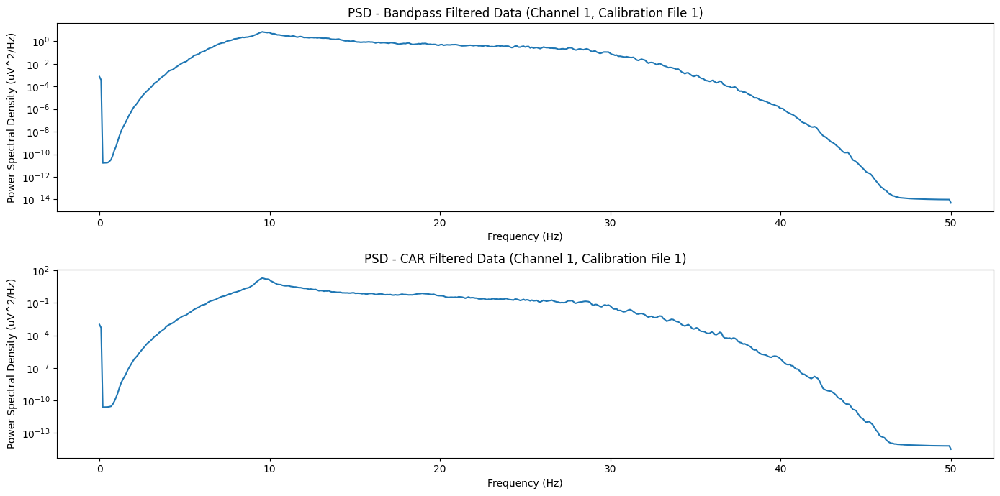

In [35]:
plt.figure(figsize=(14, 7))
plt.subplot(2, 1, 1)
plot_psd(filtered_eeg_data1[:, 0], data1.fs, 'PSD - Bandpass Filtered Data (Channel 1, Calibration File 1)')
plt.subplot(2, 1, 2)
plot_psd(car_filtered_eeg_data1[:, 0], data1.fs, 'PSD - CAR Filtered Data (Channel 1, Calibration File 1)')

plt.tight_layout()
plt.show()

#### Calibration File 2

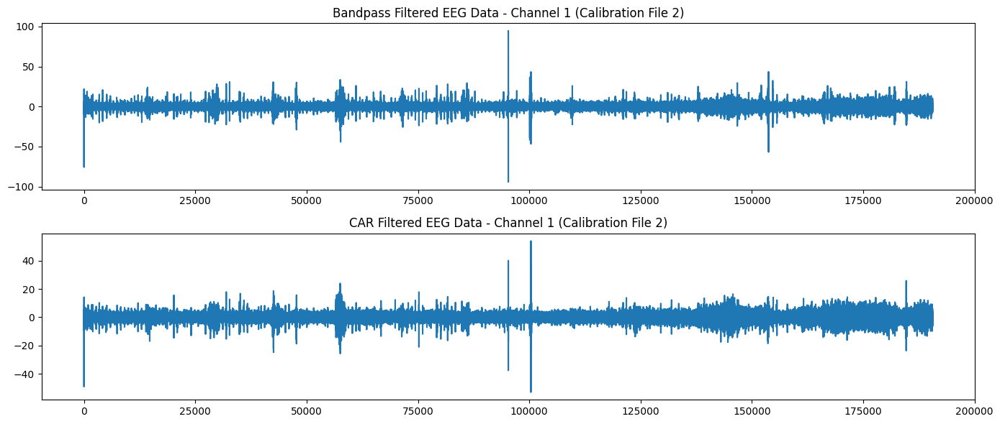

In [36]:
plt.figure(figsize=(14, 6))
plt.subplot(2, 1, 1)
plt.plot(filtered_eeg_data2[:, 0])
plt.title('Bandpass Filtered EEG Data - Channel 1 (Calibration File 2)')
plt.subplot(2, 1, 2)
plt.plot(car_filtered_eeg_data2[:, 0])
plt.title('CAR Filtered EEG Data - Channel 1 (Calibration File 2)')
plt.tight_layout()
plt.show()

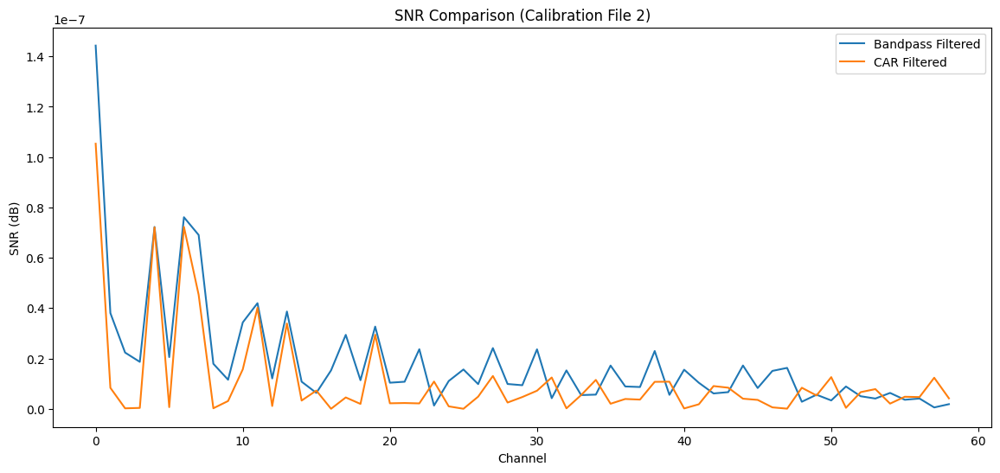

In [37]:
# Signal-to-Noise Ratio (SNR) Analysis
snr_before_car2 = compute_snr(filtered_eeg_data2)
snr_after_car2 = compute_snr(car_filtered_eeg_data2)

plt.figure(figsize=(14, 6))
plt.plot(snr_before_car2, label='Bandpass Filtered')
plt.plot(snr_after_car2, label='CAR Filtered')
plt.title('SNR Comparison (Calibration File 2)')
plt.xlabel('Channel')
plt.ylabel('SNR (dB)')
plt.legend()
plt.show()

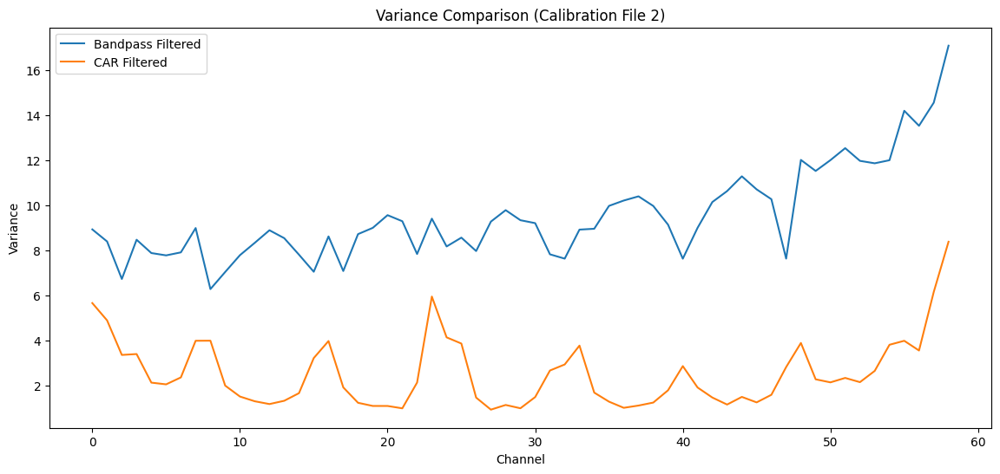

In [38]:
# Variance Comparison
plot_variance_comparison(filtered_eeg_data2, car_filtered_eeg_data2, 'Calibration File 2')

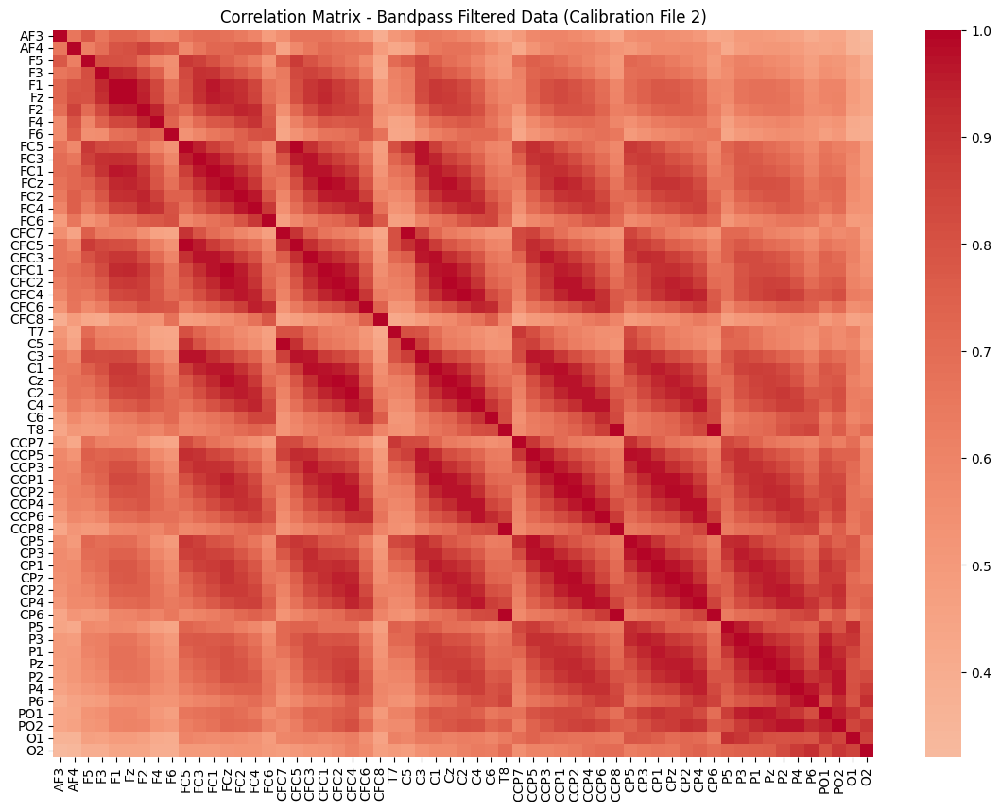

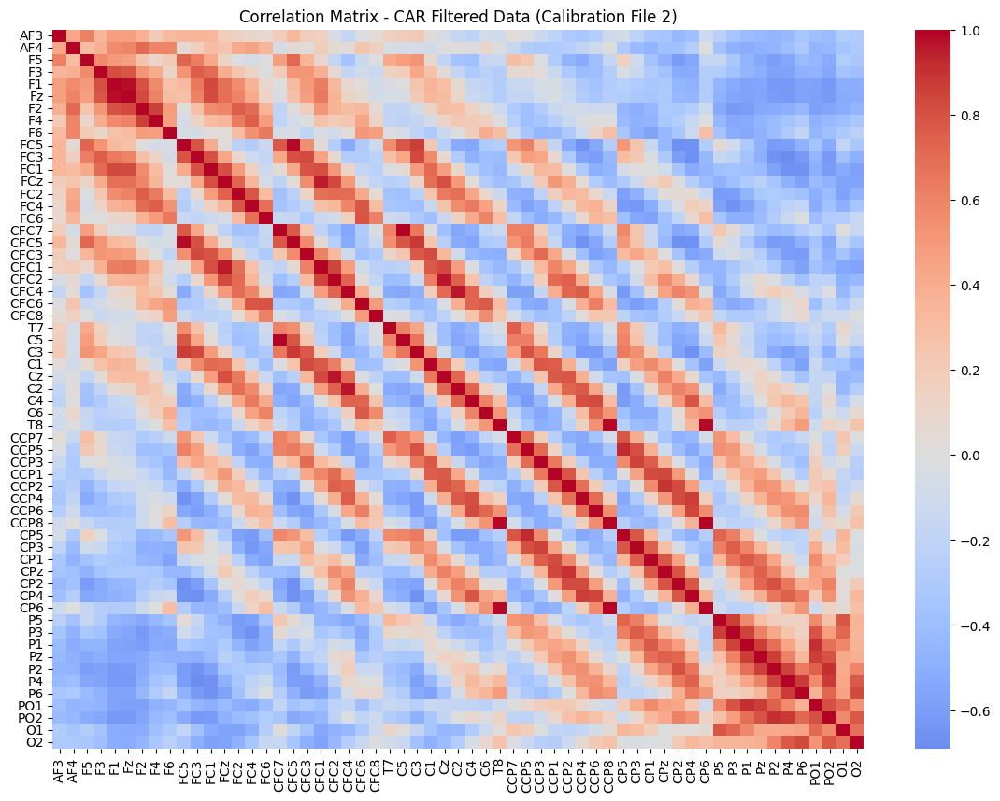

In [39]:
# Correlation Matrix Heatmap
plot_correlation_matrix(filtered_eeg_data2, 'Correlation Matrix - Bandpass Filtered Data (Calibration File 2)')
plot_correlation_matrix(car_filtered_eeg_data2, 'Correlation Matrix - CAR Filtered Data (Calibration File 2)')

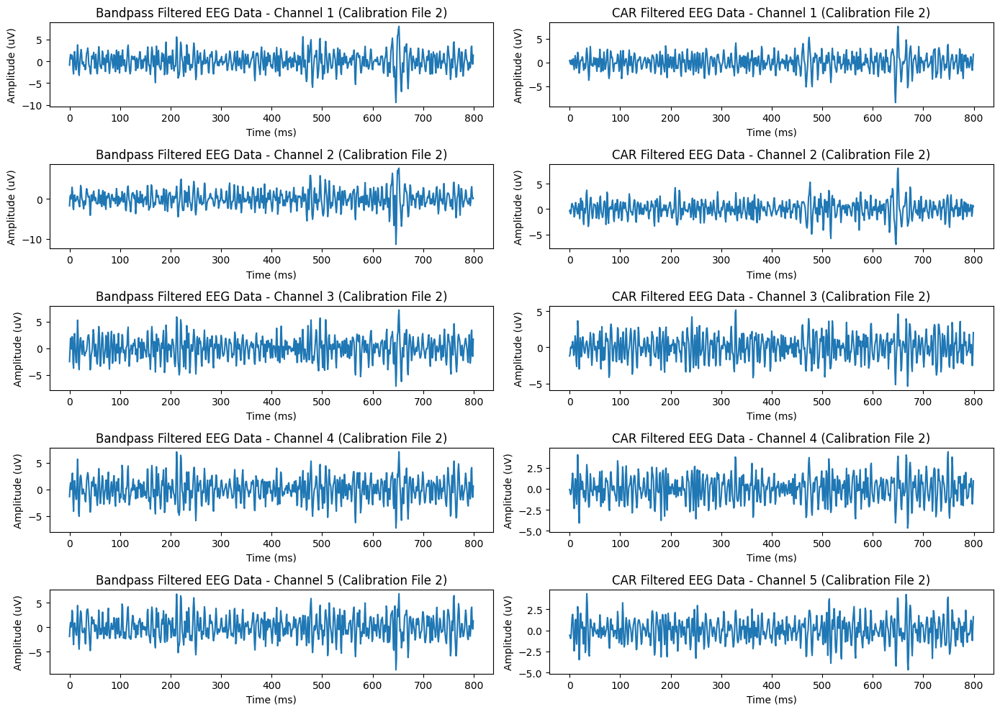

In [40]:
plt.figure(figsize=(14, 10))
channels_to_plot = 5
for i in range(channels_to_plot):
    plt.subplot(channels_to_plot, 2, 2*i + 1)
    plt.plot(filtered_eeg_data2[data1.positions[0]:data1.positions[1], i])
    plt.title(f'Bandpass Filtered EEG Data - Channel {i+1} (Calibration File 2)')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
    
    plt.subplot(channels_to_plot, 2, 2*i + 2)
    plt.plot(car_filtered_eeg_data2[data1.positions[0]:data1.positions[1], i])
    plt.title(f'CAR Filtered EEG Data - Channel {i+1} (Calibration File 2)')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
plt.tight_layout()
plt.show()

### 3-2. Laplacian Filter

In [41]:
# Find neighnors of each electrod by Delaunay triangulation
def find_neighbors_delaunay(positions):
    tri = Delaunay(positions)
    neighbors = {i: set() for i in range(len(positions))}
    for simplex in tri.simplices:
        for i in range(3):
            for j in range(i + 1, 3):
                neighbors[simplex[i]].add(simplex[j])
                neighbors[simplex[j]].add(simplex[i])
    
    return neighbors

# Apply Laplacian filter
def apply_laplacian_filter(data, positions):
    neighbors = find_neighbors_delaunay(positions)
    laplacian_filtered_data = np.zeros_like(data)
    for i in range(data.shape[1]):
        if neighbors[i]: 
            laplacian_filtered_data[:, i] = data[:, i] - np.mean(data[:, list(neighbors[i])], axis=1)
        else:
            laplacian_filtered_data[:, i] = data[:, i]
    return laplacian_filtered_data

In [42]:
# ٍExtract Electrod positions
electrode_positions1 = np.hstack((data1.xpos, data1.ypos))
electrode_positions2 = np.hstack((data2.xpos, data2.ypos))

# Apply Laplacian filter
laplacian_filtered_eeg_data1 = apply_laplacian_filter(car_filtered_eeg_data1, electrode_positions1)
laplacian_filtered_eeg_data2 = apply_laplacian_filter(car_filtered_eeg_data2, electrode_positions2)

####  Plot before and after Laplacian filtering - Calibration File 1

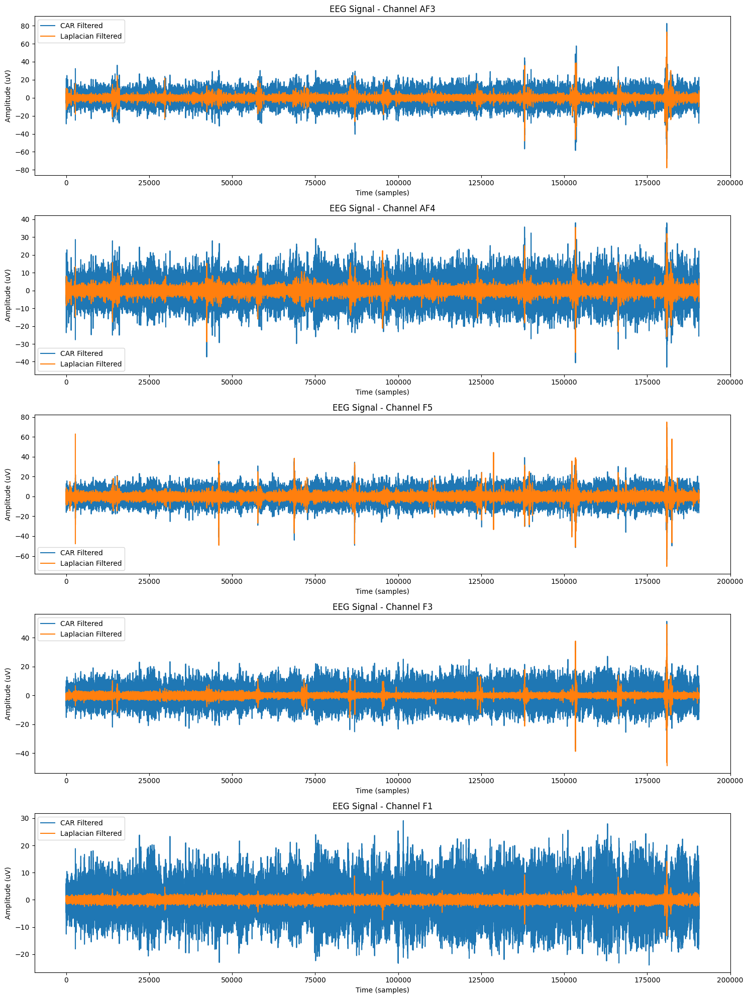

In [43]:
plt.figure(figsize=(15, 20))
for i in range(5):
    plt.subplot(5, 1, i + 1)
    plt.plot(car_filtered_eeg_data1[:, i], label='CAR Filtered')
    plt.plot(laplacian_filtered_eeg_data1[:, i], label='Laplacian Filtered')
    plt.title(f'EEG Signal - Channel {data1.channel_labels[i]}')
    plt.xlabel('Time (samples)')
    plt.ylabel('Amplitude (uV)')
    plt.legend()
plt.tight_layout()
plt.show()


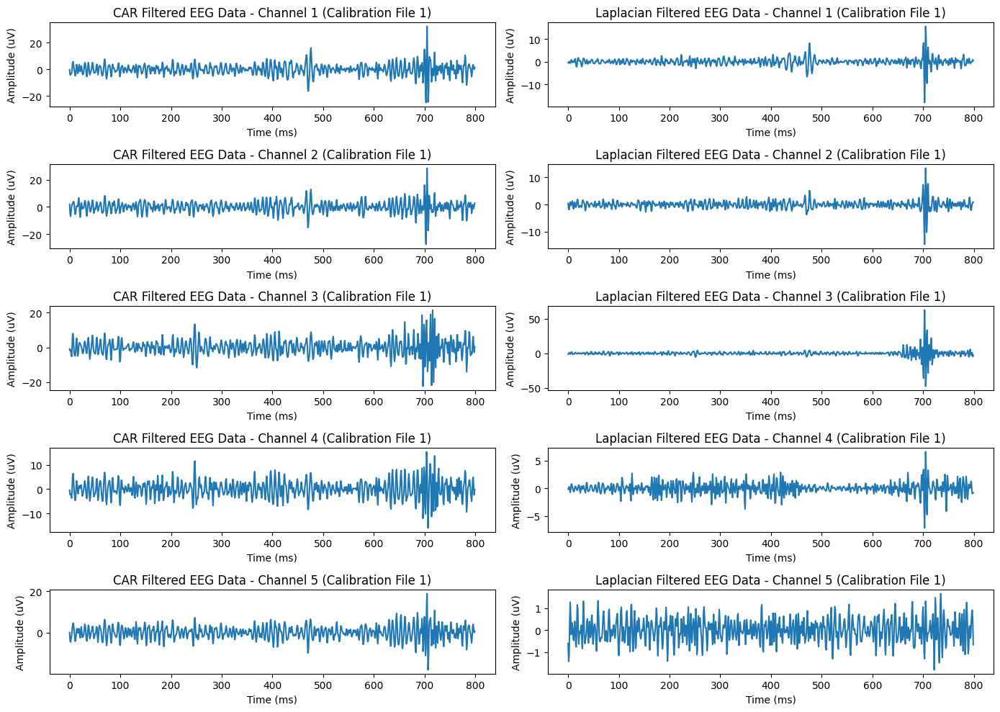

In [44]:
plt.figure(figsize=(14, 10))
channels_to_plot = 5
for i in range(channels_to_plot):
    plt.subplot(channels_to_plot, 2, 2*i + 1)
    plt.plot(car_filtered_eeg_data1[data1.positions[0]:data1.positions[1], i])
    plt.title(f'CAR Filtered EEG Data - Channel {i+1} (Calibration File 1)')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
    
    plt.subplot(channels_to_plot, 2, 2*i + 2)
    plt.plot(laplacian_filtered_eeg_data1[data1.positions[0]:data1.positions[1], i])
    plt.title(f'Laplacian Filtered EEG Data - Channel {i+1} (Calibration File 1)')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
plt.tight_layout()
plt.show()

####  Plot before and after Laplacian filtering - Calibration File 2

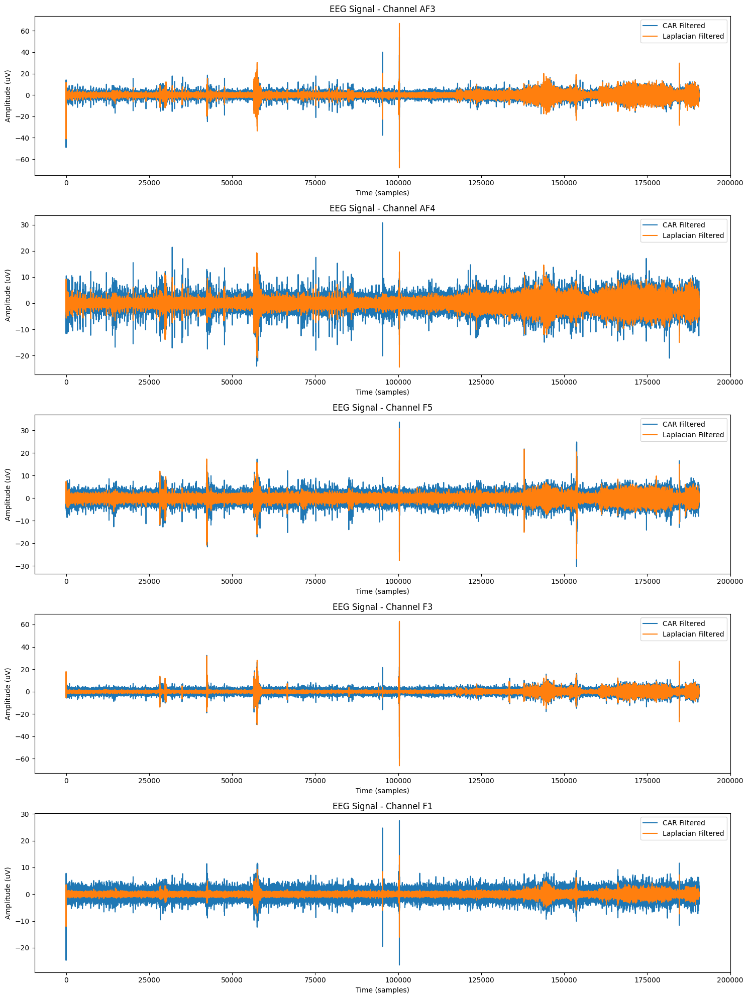

In [45]:
plt.figure(figsize=(15, 20))
for i in range(5):
    plt.subplot(5, 1, i + 1)
    plt.plot(car_filtered_eeg_data2[:, i], label='CAR Filtered')
    plt.plot(laplacian_filtered_eeg_data2[:, i], label='Laplacian Filtered')
    plt.title(f'EEG Signal - Channel {data2.channel_labels[i]}')
    plt.xlabel('Time (samples)')
    plt.ylabel('Amplitude (uV)')
    plt.legend()
plt.tight_layout()
plt.show()


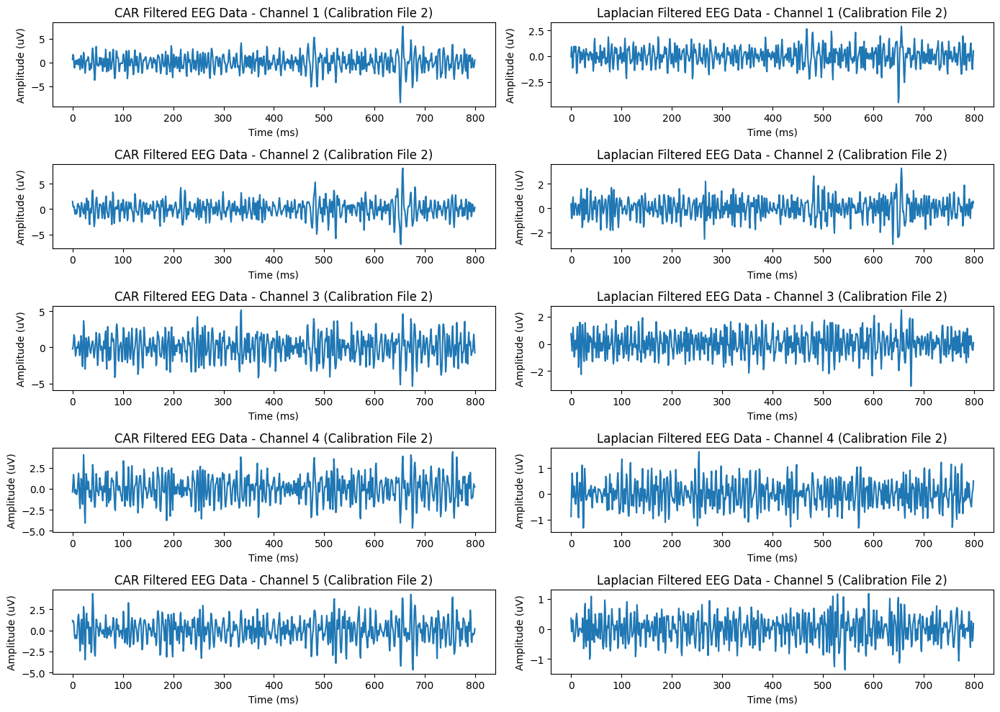

In [46]:
plt.figure(figsize=(14, 10))
channels_to_plot = 5
for i in range(channels_to_plot):
    plt.subplot(channels_to_plot, 2, 2*i + 1)
    plt.plot(car_filtered_eeg_data2[data2.positions[0]:data2.positions[1], i])
    plt.title(f'CAR Filtered EEG Data - Channel {i+1} (Calibration File 2)')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
    
    plt.subplot(channels_to_plot, 2, 2*i + 2)
    plt.plot(laplacian_filtered_eeg_data2[data2.positions[0]:data2.positions[1], i])
    plt.title(f'Laplacian Filtered EEG Data - Channel {i+1} (Calibration File 2)')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
plt.tight_layout()
plt.show()

### 3-3 . PCA (Principal Component Analysis)

In [47]:
def apply_pca(data, n_components=n_dr):
    pca = PCA(n_components=n_components)
    pca_data = pca.fit_transform(data)
    return pca_data

In [48]:
pca_eeg_data1 = apply_pca(laplacian_filtered_eeg_data1)
pca_eeg_data2 = apply_pca(laplacian_filtered_eeg_data2)

print(f"EEG Data Shape (Calibration File 1) before PCA: {laplacian_filtered_eeg_data1.shape}")
print(f"EEG Data Shape (Calibration File 2) before PCA: {laplacian_filtered_eeg_data1.shape}")

print(f"PCA EEG Data Shape (Calibration File 1): {pca_eeg_data1.shape}")
print(f"PCA EEG Data Shape (Calibration File 2): {pca_eeg_data2.shape}")

EEG Data Shape (Calibration File 1) before PCA: (190594, 59)
EEG Data Shape (Calibration File 2) before PCA: (190594, 59)
PCA EEG Data Shape (Calibration File 1): (190594, 10)
PCA EEG Data Shape (Calibration File 2): (190594, 10)


### 3-4. ICA (Independent Component Analysis)

In [49]:
def apply_ica(data, n_components=n_dr):
    ica = FastICA(n_components=n_components, whiten='unit-variance')
    ica_data = ica.fit_transform(data)
    return ica_data

In [50]:
ica_eeg_data1 = apply_ica(laplacian_filtered_eeg_data1)
ica_eeg_data2 = apply_ica(laplacian_filtered_eeg_data2)


print(f"EEG Data Shape (Calibration File 1) before ICA: {laplacian_filtered_eeg_data1.shape}")
print(f"EEG Data Shape (Calibration File 2) before ICA: {laplacian_filtered_eeg_data1.shape}")

print(f"ICA EEG Data Shape (Calibration File 1): {ica_eeg_data1.shape}")
print(f"ICA EEG Data Shape (Calibration File 2): {ica_eeg_data2.shape}")

EEG Data Shape (Calibration File 1) before ICA: (190594, 59)
EEG Data Shape (Calibration File 2) before ICA: (190594, 59)
ICA EEG Data Shape (Calibration File 1): (190594, 10)
ICA EEG Data Shape (Calibration File 2): (190594, 10)


# Define Function for Extract Windows

In [51]:
def extract_windows(cnt_eeg, targets, positions):
    """
    Extract windows from continuous EEG data using marker positions.
    
    Args:
        cnt_eeg (np.array): continuous EEG data.
        targets (np.array): Target classes.
        positions (np.array): Positions of the markers.
    
    Returns:
        windows (np.array): Extracted windows.
        labels (np.array): Labels for the windows.
    """

    # Calculate window sizes
    window_sizes = np.diff(positions)
    # Find the most frequent window size
    (unique, counts) = np.unique(window_sizes, return_counts=True)
    n_samples = unique[np.argmax(counts)]
    windows = []
    labels  = []
    for i in range(len(positions)):
        start = positions[i]
        if i == (len(positions) - 1):
            end = cnt_eeg.shape[0]
        else:
            end = positions[i + 1]

        window = cnt_eeg[start:end, :]
        # Resize window to fixed length
        if window.shape[0] > n_samples:
            window  = window[:n_samples, :]
        elif window.shape[0] < n_samples:
            padding = np.zeros((n_samples - window.shape[0], window.shape[1]))
            window  = np.vstack((window, padding))
            
        windows.append(window)
        labels.append(targets[i])

    return np.array(windows), np.array(labels)


# t-SNE

### laplacian_filtered_eeg_data

In [52]:
eeg_windows1, eeg_labels1 = extract_windows(laplacian_filtered_eeg_data1, data1.labels, data1.positions)
eeg_windows2, eeg_labels2 = extract_windows(laplacian_filtered_eeg_data2, data2.labels, data2.positions)

print(f'Shape of data1 after windowing {eeg_windows1.shape}, shape of labels{eeg_labels1.shape}')
print(f'Shape of data1 after windowing {eeg_windows2.shape}, shape of labels{eeg_labels2.shape}')

Shape of data1 after windowing (200, 800, 59), shape of labels(200,)
Shape of data1 after windowing (200, 800, 59), shape of labels(200,)


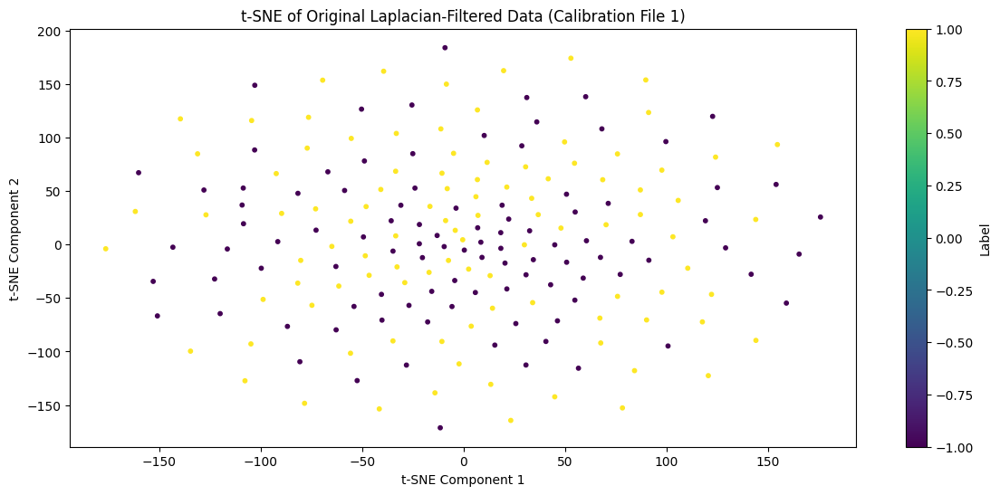

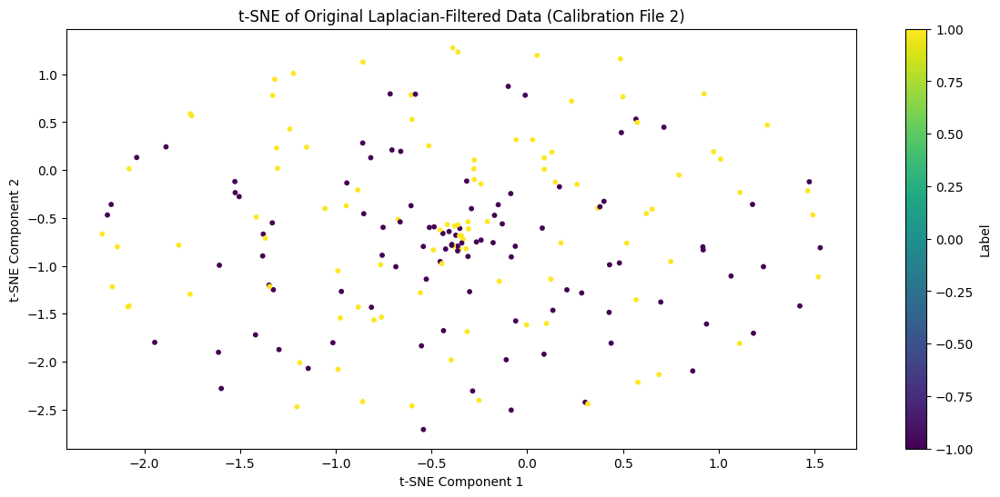

In [53]:
def apply_tsne(data, labels, title):
    tsne = TSNE(n_components=2, random_state=42)
    tsne_data = tsne.fit_transform(data)
    
    plt.figure(figsize=(14, 6))
    scatter = plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=labels.flatten(), cmap='viridis', s=10)
    plt.colorbar(scatter, label='Label')
    plt.title(title)
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.show()

apply_tsne(eeg_windows1.reshape((len(eeg_windows1), -1)), eeg_labels1, 't-SNE of Original Laplacian-Filtered Data (Calibration File 1)')
apply_tsne(eeg_windows2.reshape((len(eeg_windows2), -1)), eeg_labels2, 't-SNE of Original Laplacian-Filtered Data (Calibration File 2)')

### pca_eeg_data

In [54]:
eeg_windows1, eeg_labels1 = extract_windows(pca_eeg_data1, data1.labels, data1.positions)
eeg_windows2, eeg_labels2 = extract_windows(pca_eeg_data2, data2.labels, data2.positions)

print(f'Shape of data1 after windowing {eeg_windows1.shape}, shape of labels{eeg_labels1.shape}')
print(f'Shape of data1 after windowing {eeg_windows2.shape}, shape of labels{eeg_labels2.shape}')

Shape of data1 after windowing (200, 800, 10), shape of labels(200,)
Shape of data1 after windowing (200, 800, 10), shape of labels(200,)


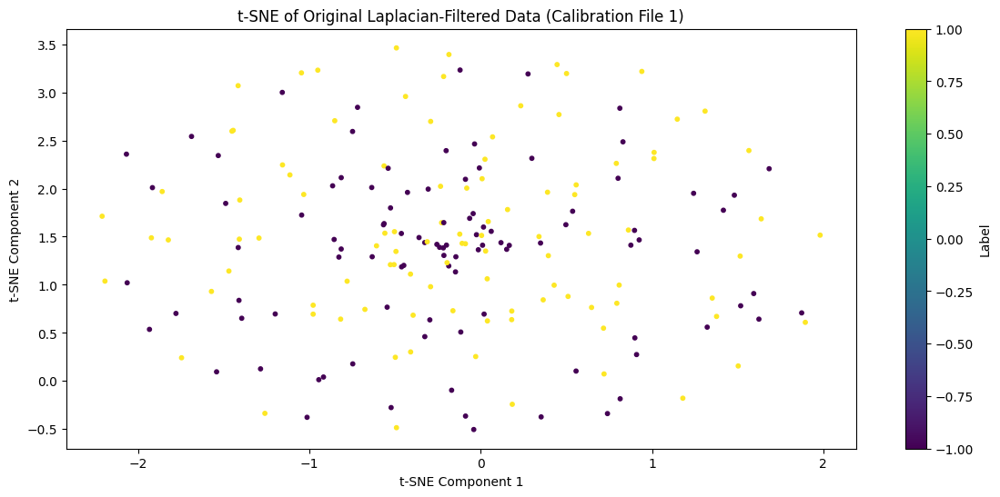

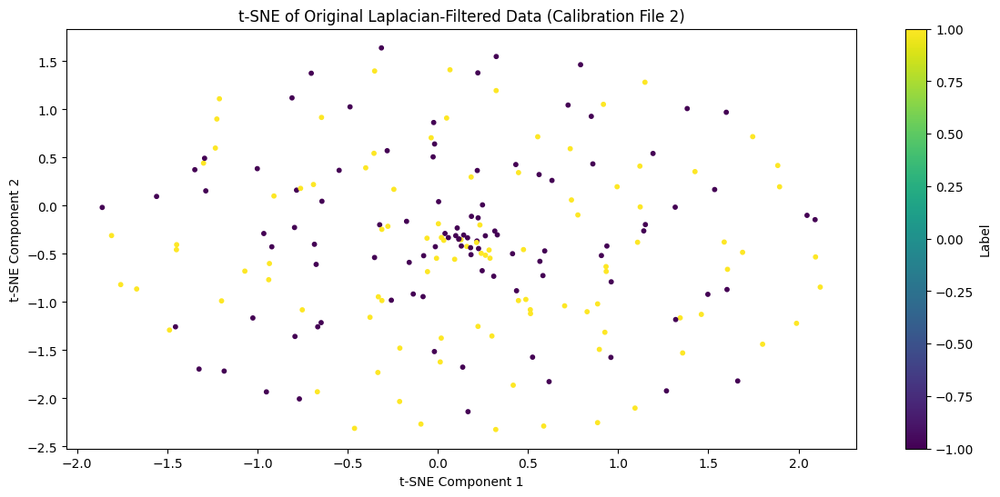

In [55]:
def apply_tsne(data, labels, title):
    tsne = TSNE(n_components=2, random_state=42)
    tsne_data = tsne.fit_transform(data)
    
    plt.figure(figsize=(14, 6))
    scatter = plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=labels.flatten(), cmap='viridis', s=10)
    plt.colorbar(scatter, label='Label')
    plt.title(title)
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.show()

apply_tsne(eeg_windows1.reshape((len(eeg_windows1), -1)), eeg_labels1, 't-SNE of Original Laplacian-Filtered Data (Calibration File 1)')
apply_tsne(eeg_windows2.reshape((len(eeg_windows2), -1)), eeg_labels2, 't-SNE of Original Laplacian-Filtered Data (Calibration File 2)')

### ica_eeg_data

In [56]:
eeg_windows1, eeg_labels1 = extract_windows(ica_eeg_data1, data1.labels, data1.positions)
eeg_windows2, eeg_labels2 = extract_windows(ica_eeg_data2, data2.labels, data2.positions)

print(f'Shape of data1 after windowing {eeg_windows1.shape}, shape of labels{eeg_labels1.shape}')
print(f'Shape of data1 after windowing {eeg_windows2.shape}, shape of labels{eeg_labels2.shape}')

Shape of data1 after windowing (200, 800, 10), shape of labels(200,)
Shape of data1 after windowing (200, 800, 10), shape of labels(200,)


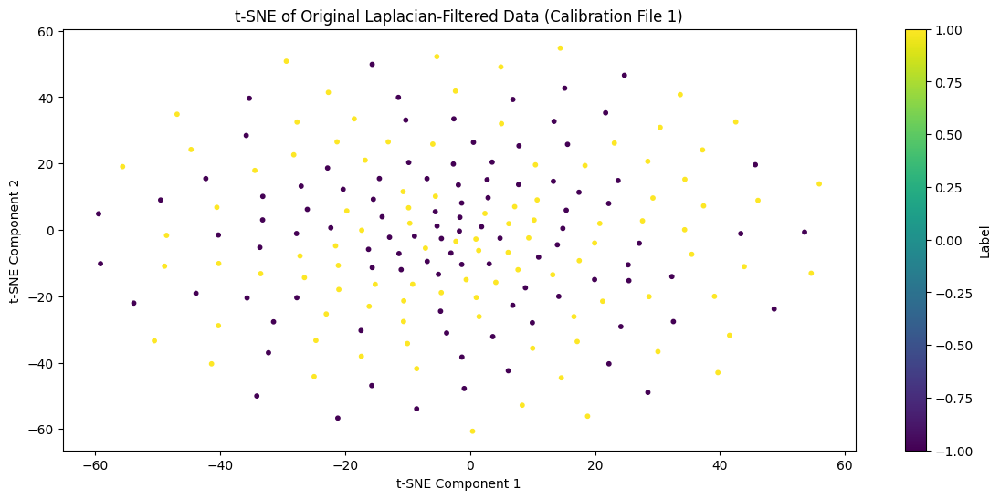

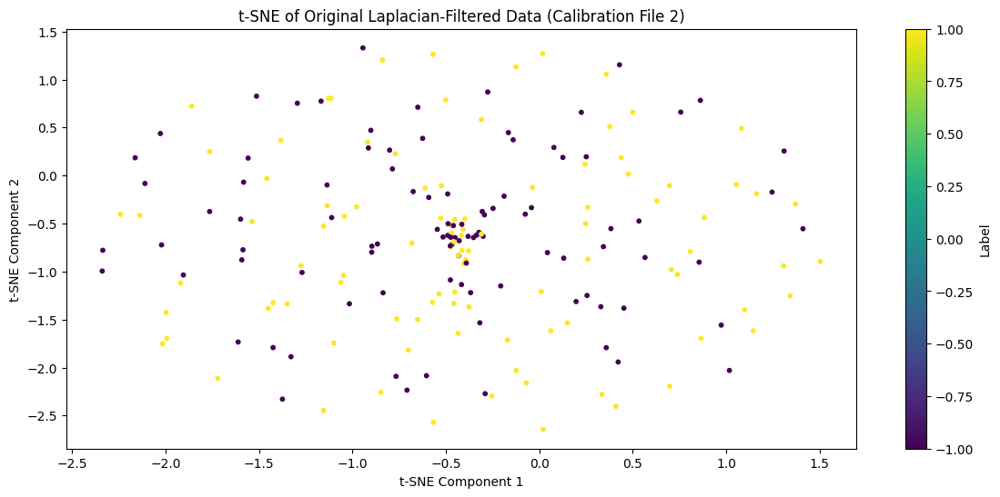

In [57]:
def apply_tsne(data, labels, title):
    tsne = TSNE(n_components=2, random_state=42)
    tsne_data = tsne.fit_transform(data)
    
    plt.figure(figsize=(14, 6))
    scatter = plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=labels.flatten(), cmap='viridis', s=10)
    plt.colorbar(scatter, label='Label')
    plt.title(title)
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.show()

apply_tsne(eeg_windows1.reshape((len(eeg_windows1), -1)), eeg_labels1, 't-SNE of Original Laplacian-Filtered Data (Calibration File 1)')
apply_tsne(eeg_windows2.reshape((len(eeg_windows2), -1)), eeg_labels2, 't-SNE of Original Laplacian-Filtered Data (Calibration File 2)')

# apply_tsne(pca_eeg_data1, labels1, 't-SNE of PCA-Transformed Data (Calibration File 1)')
# apply_tsne(pca_eeg_data2, labels2, 't-SNE of PCA-Transformed Data (Calibration File 2)')

# 5. Feature Extraction

## Output of preprocessing

In [58]:
if preproc == 'ica':
    preprocessed_data1 = ica_eeg_data1
    preprocessed_data2 = ica_eeg_data2
elif preproc == 'pca':
    preprocessed_data1 = pca_eeg_data1
    preprocessed_data2 = pca_eeg_data2
else:
    preprocessed_data1 = laplacian_filtered_eeg_data1
    preprocessed_data2 = laplacian_filtered_eeg_data2
    
print(preprocessed_data1.shape)
print(preprocessed_data2.shape)

(190594, 59)
(190594, 59)


# Extract Windows

In [59]:
eeg_windows1, eeg_labels1 = extract_windows(preprocessed_data1, data1.labels, data1.positions)
eeg_windows2, eeg_labels2 = extract_windows(preprocessed_data2, data2.labels, data2.positions)

print(f'Shape of data1 after windowing {eeg_windows1.shape}, shape of labels{eeg_labels1.shape}')
print(f'Shape of data1 after windowing {eeg_windows2.shape}, shape of labels{eeg_labels2.shape}')

Shape of data1 after windowing (200, 800, 59), shape of labels(200,)
Shape of data1 after windowing (200, 800, 59), shape of labels(200,)


### Calibration File 1

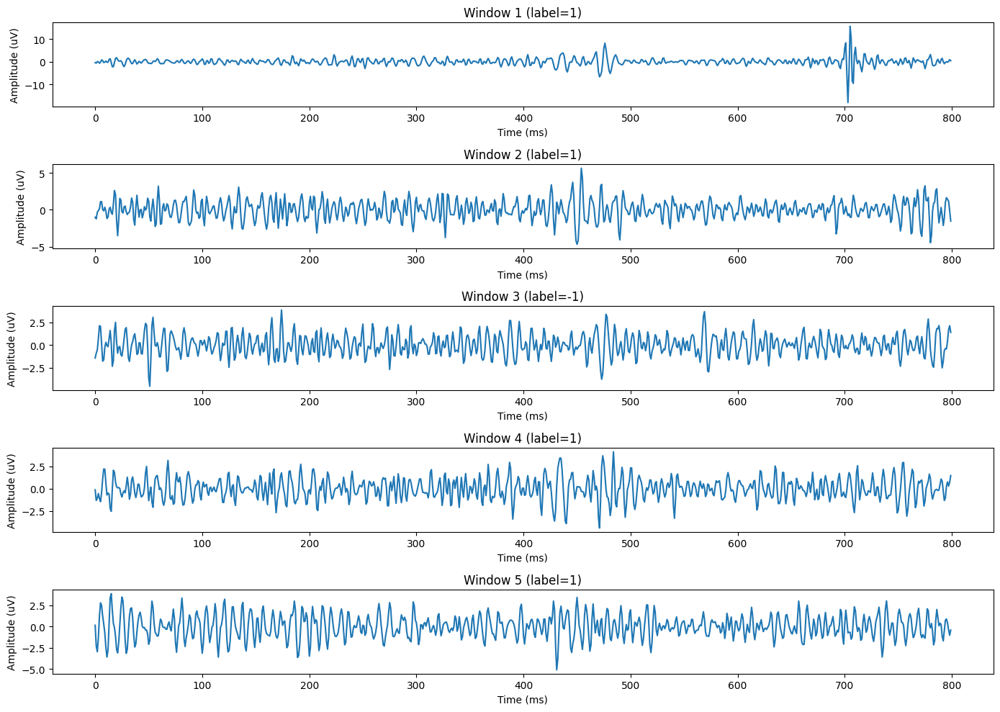

In [60]:
plt.figure(figsize=(14, 10))
for i in range(5): # Plot for 5 windows
    plt.subplot(5, 1, i + 1)
    plt.plot(eeg_windows1[i, :, 0])  # Plotting the first channel of the ith window
    plt.title(f'Window {i+1} (label={eeg_labels1[i]})')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
plt.tight_layout()
plt.show()


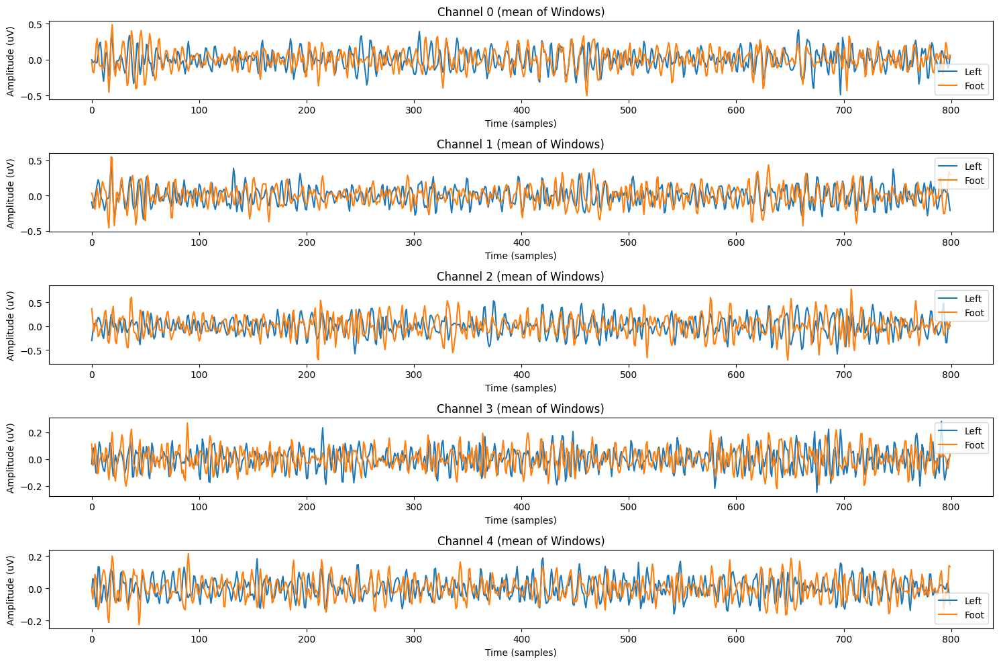

In [61]:
mean_left = np.mean(eeg_windows1[eeg_labels1==-1], axis=0)
mean_foot = np.mean(eeg_windows1[eeg_labels1==1], axis=0)

# Plot an example window
plt.figure(figsize=(15, 10))
for i in range(5):  
    plt.subplot(5, 1, i+1)
    plt.plot(mean_left[:, i], label='Left')
    plt.plot(mean_foot[:, i], label='Foot')
    plt.title(f'Channel {i} (mean of Windows)')
    plt.xlabel('Time (samples)')
    plt.ylabel('Amplitude (uV)')
    plt.legend()
plt.tight_layout()
plt.show()

### Calibration File 2

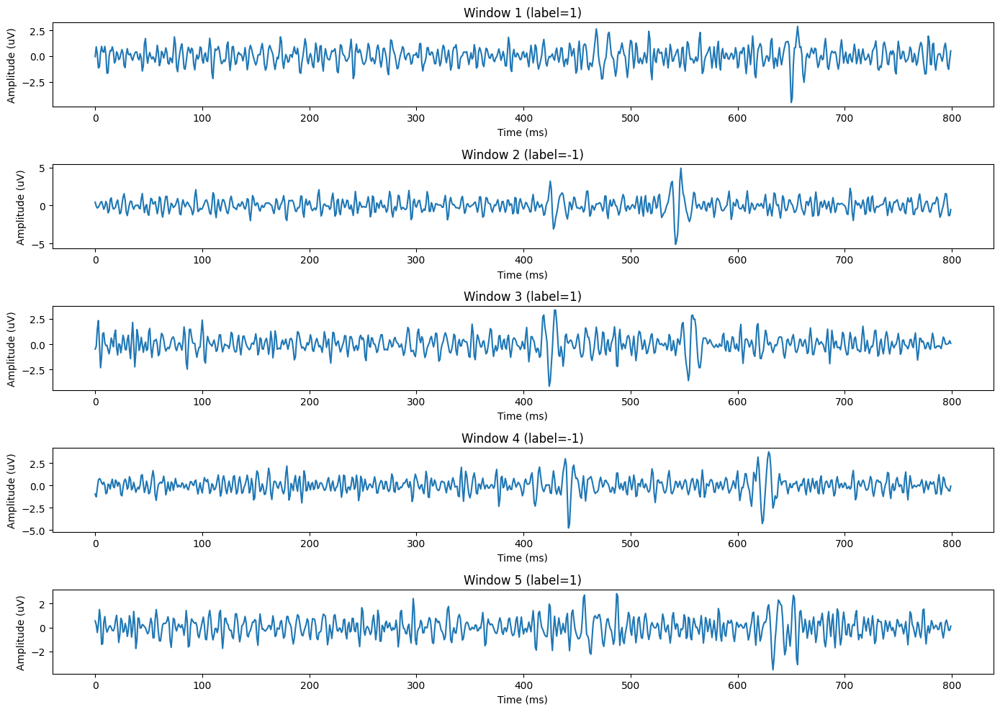

In [62]:
plt.figure(figsize=(14, 10))
for i in range(5): # Plot for 5 windows
    plt.subplot(5, 1, i + 1)
    plt.plot(eeg_windows2[i, :, 0])  # Plotting the first channel of the ith window
    plt.title(f'Window {i+1} (label={eeg_labels2[i]})')
    plt.xlabel('Time (ms)')
    plt.ylabel('Amplitude (uV)')
plt.tight_layout()
plt.show()


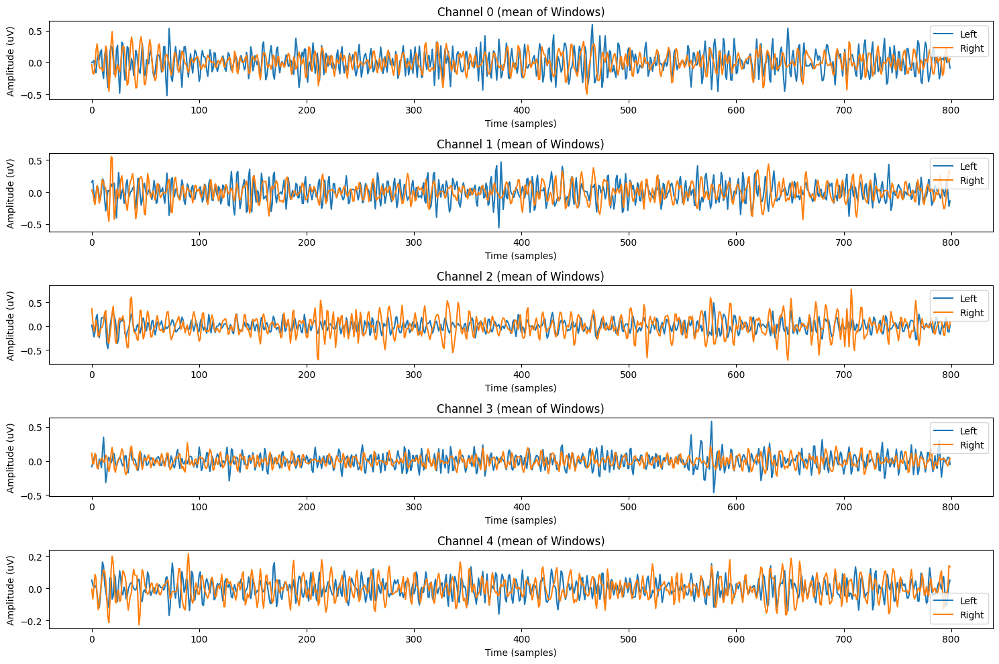

In [63]:
mean_left  = np.mean(eeg_windows2[eeg_labels2==-1], axis=0)
mean_right = np.mean(eeg_windows2[eeg_labels2==1], axis=0)

# Plot an example window
plt.figure(figsize=(15, 10))
for i in range(5):  
    plt.subplot(5, 1, i+1)
    plt.plot(mean_left[:, i], label='Left')
    plt.plot(mean_foot[:, i], label='Right')
    plt.title(f'Channel {i} (mean of Windows)')
    plt.xlabel('Time (samples)')
    plt.ylabel('Amplitude (uV)')
    plt.legend()
plt.tight_layout()
plt.show()

## Common Spatial Patterns (CSP)

In [64]:
eeg_windows1_tr = np.transpose(eeg_windows1, (0, 2, 1))
eeg_windows2_tr = np.transpose(eeg_windows2, (0, 2, 1))

print(eeg_windows1_tr.shape)  # Output will be (5, 3, 10)

(200, 59, 800)


In [65]:
labels1 = np.where(eeg_labels1 == -1, 0, 1)  # labels are -1 and 1, we convert them to 0 and 1

# Apply CSP
csp1 = CSP(n_components=n_csp, reg='oas', log=True, norm_trace=False)
X_csp1 = csp1.fit_transform(eeg_windows1_tr, labels1)
print(f"CSP EEG Data Shape (Calibration File 1): {X_csp1.shape}")

Computing rank from data with rank=None
    Using tolerance 31 (2.2e-16 eps * 59 dim * 2.4e+15  max singular value)
    Estimated rank (data): 58
    data: rank 58 computed from 59 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 59 -> 58
Estimating class=0 covariance using OAS
Done.
Estimating class=1 covariance using OAS
Done.
CSP EEG Data Shape (Calibration File 1): (200, 40)


In [66]:
labels2 = np.where(eeg_labels2 == -1, 0, 1)  # labels are -1 and 1, we convert them to 0 and 1
csp2 = CSP(n_components=n_csp, reg='oas', log=True, norm_trace=False)
X_csp2 = csp2.fit_transform(eeg_windows2_tr, labels2)
print(f"CSP EEG Data Shape (Calibration File 2): {X_csp2.shape}")

Computing rank from data with rank=None
    Using tolerance 11 (2.2e-16 eps * 59 dim * 8.7e+14  max singular value)
    Estimated rank (data): 58
    data: rank 58 computed from 59 data channels with 0 projectors
    Setting small data eigenvalues to zero (without PCA)
Reducing data rank from 59 -> 58
Estimating class=0 covariance using OAS
Done.
Estimating class=1 covariance using OAS
Done.
CSP EEG Data Shape (Calibration File 2): (200, 40)


## Visual Comparison - TSNE

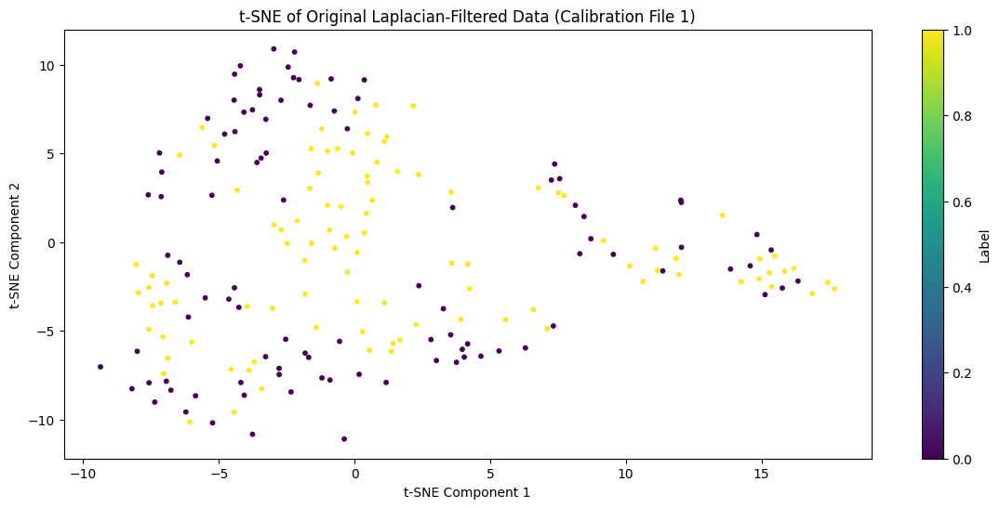

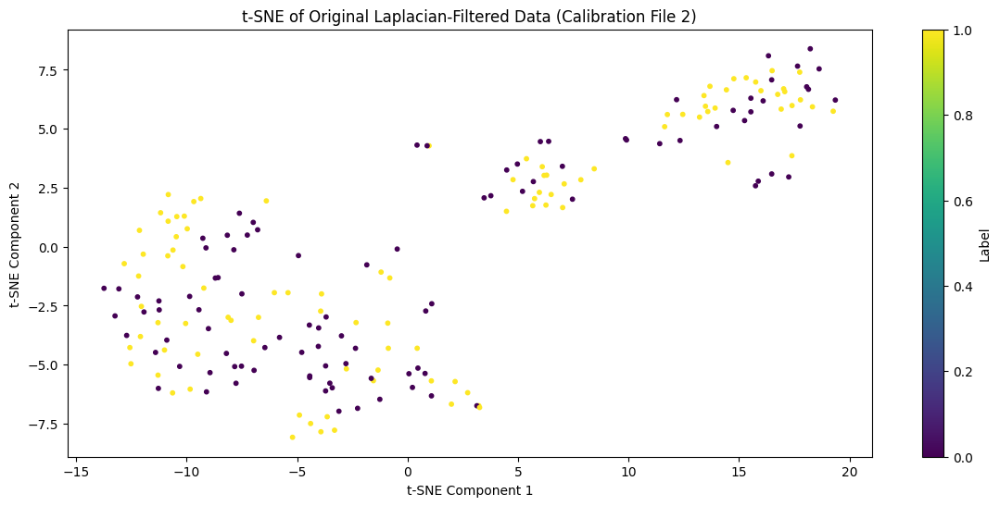

In [67]:
def apply_tsne(data, labels, title):
    tsne = TSNE(n_components=2, random_state=42)
    tsne_data = tsne.fit_transform(data)
    
    plt.figure(figsize=(14, 6))
    scatter = plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=labels.flatten(), cmap='viridis', s=10)
    plt.colorbar(scatter, label='Label')
    plt.title(title)
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.show()

apply_tsne(X_csp1, labels1, 't-SNE of Original Laplacian-Filtered Data (Calibration File 1)')
apply_tsne(X_csp2, labels2, 't-SNE of Original Laplacian-Filtered Data (Calibration File 2)')

## Fast Fourier Transform (FFT)

In [68]:
def apply_fft(data):
    fft_data = np.fft.fft(data, axis=1)
    return np.abs(fft_data)

fft_eeg_data1 = apply_fft(eeg_windows1)
fft_eeg_data2 = apply_fft(eeg_windows2)

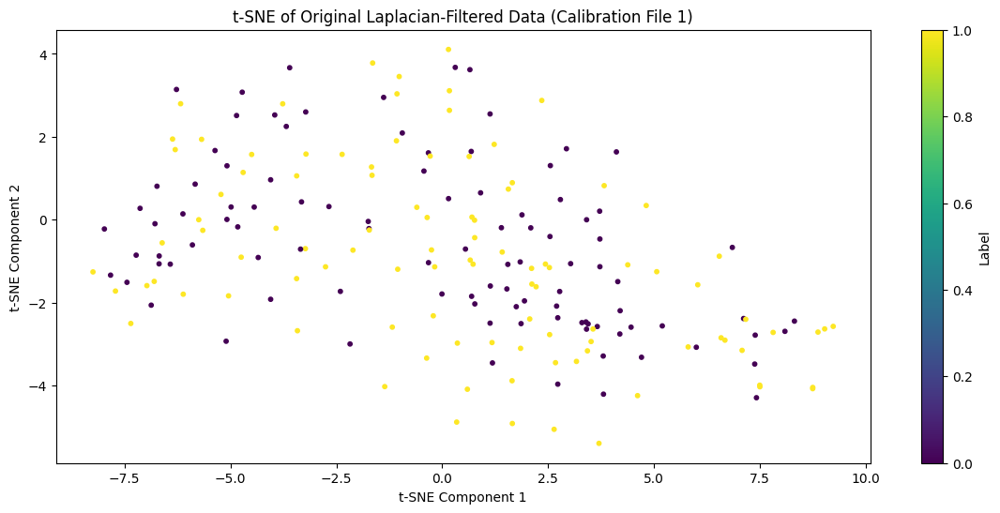

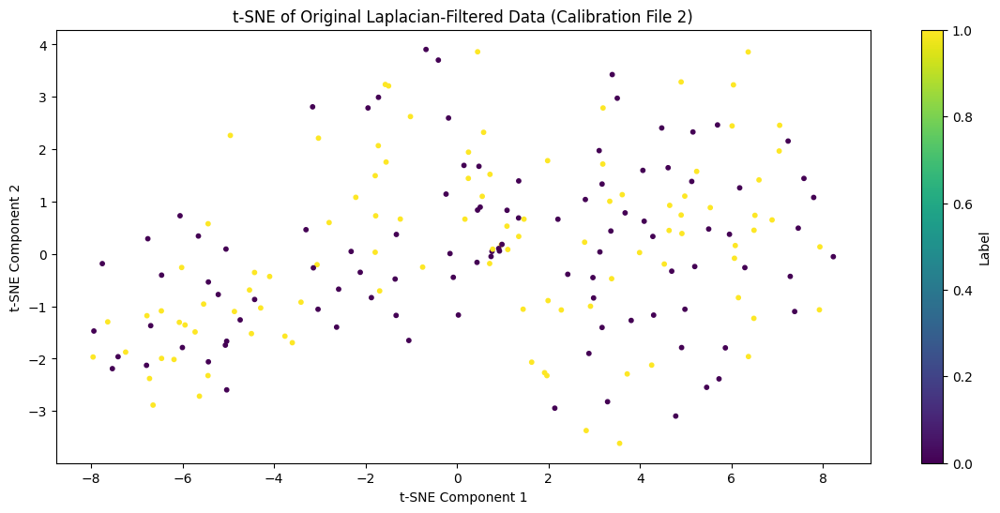

In [69]:
def apply_tsne(data, labels, title):
    tsne = TSNE(n_components=2, random_state=42)
    tsne_data = tsne.fit_transform(data)
    
    plt.figure(figsize=(14, 6))
    scatter = plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=labels.flatten(), cmap='viridis', s=10)
    plt.colorbar(scatter, label='Label')
    plt.title(title)
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.show()

apply_tsne(fft_eeg_data1.reshape((len(fft_eeg_data1), -1)), labels1, 't-SNE of Original Laplacian-Filtered Data (Calibration File 1)')
apply_tsne(fft_eeg_data2.reshape((len(fft_eeg_data2), -1)), labels2, 't-SNE of Original Laplacian-Filtered Data (Calibration File 2)')

## Wavelet Transform

In [70]:
# Function to apply Wavelet Transform
def apply_wavelet(data, wavelet='db4', level=4):
    coeffs = [pywt.wavedec(trial, wavelet, level=level) for trial in data]
    wavelet_data = np.array([np.hstack(coeff) for coeff in coeffs])
    return wavelet_data

wavelet_eeg_data1 = apply_wavelet(eeg_windows1)
wavelet_eeg_data2 = apply_wavelet(eeg_windows2)

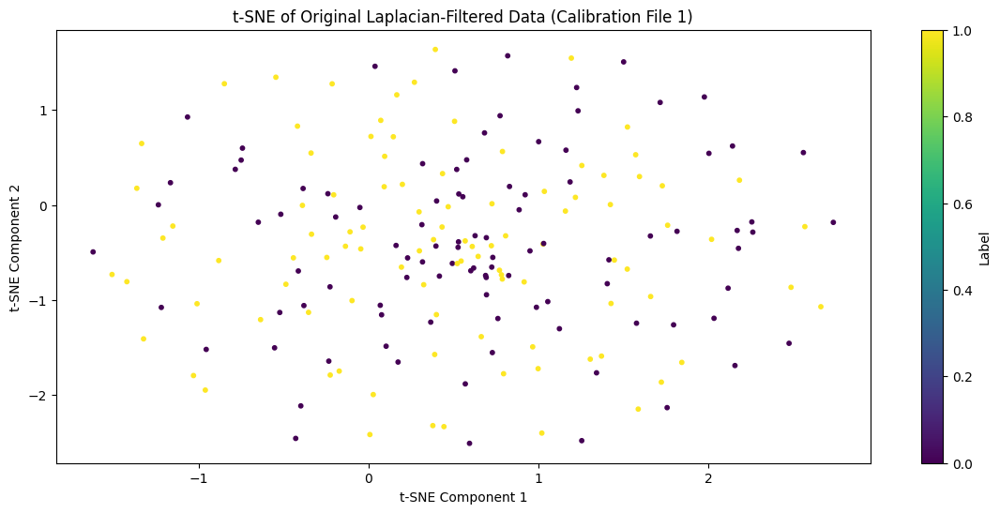

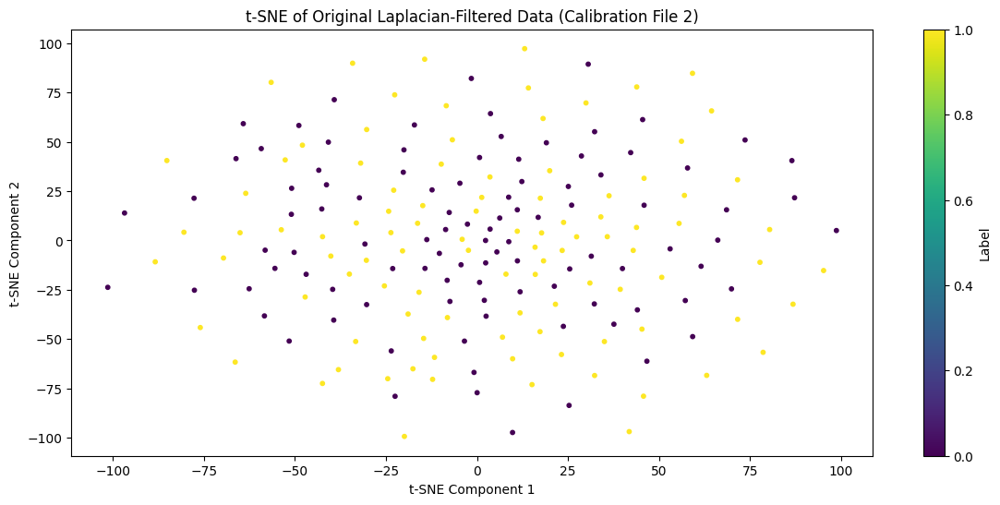

In [71]:
def apply_tsne(data, labels, title):
    tsne = TSNE(n_components=2, random_state=42)
    tsne_data = tsne.fit_transform(data)
    
    plt.figure(figsize=(14, 6))
    scatter = plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=labels.flatten(), cmap='viridis', s=10)
    plt.colorbar(scatter, label='Label')
    plt.title(title)
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.show()

apply_tsne(wavelet_eeg_data1.reshape((len(wavelet_eeg_data1), -1)), labels1, 't-SNE of Original Laplacian-Filtered Data (Calibration File 1)')
apply_tsne(wavelet_eeg_data2.reshape((len(wavelet_eeg_data2), -1)), labels2, 't-SNE of Original Laplacian-Filtered Data (Calibration File 2)')

# Classification

## Standardization

In [72]:
if std:
    scaler = StandardScaler()
    X_csp1 = scaler.fit_transform(X_csp1)
    X_csp2 = scaler.fit_transform(X_csp2)   
    

## Split Data - Train and Test

In [73]:
# Split data into training and testing sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(X_csp1, labels1, test_size=0.25, stratify=labels1, random_state=42)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_csp2, labels2, test_size=0.25, stratify=labels2, random_state=42)


## Define function for prine result of classification

In [74]:
def clf_result(y_true:np.array, predictions:np.array, y_pred:np.array, model_name:str):
    print(f"{model_name} Confusion Matrix:\n", confusion_matrix(y_true, y_pred))
    print(f"{model_name} Classification Report:\n", classification_report(y_true, y_pred))

    fpr, tpr, _ = roc_curve(y_true, predictions)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:0.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model_name} ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

## SVM Classifier - Calibration File 1

---------- Train Results of SVM ----------
SVM Confusion Matrix:
 [[74  1]
 [ 4 71]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97        75
           1       0.99      0.95      0.97        75

    accuracy                           0.97       150
   macro avg       0.97      0.97      0.97       150
weighted avg       0.97      0.97      0.97       150



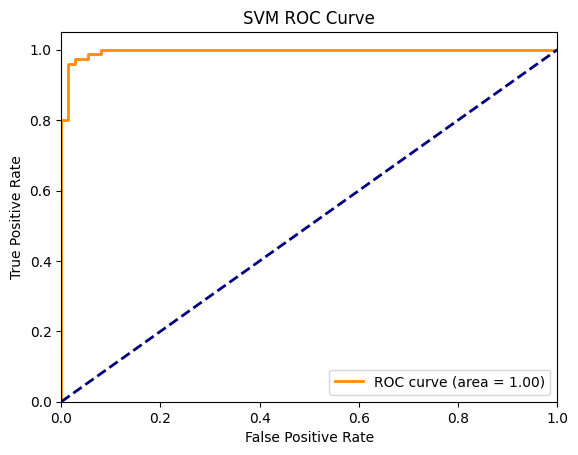



 ---------- Test Results  of SVM ----------
SVM Confusion Matrix:
 [[24  1]
 [ 6 19]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.96      0.87        25
           1       0.95      0.76      0.84        25

    accuracy                           0.86        50
   macro avg       0.88      0.86      0.86        50
weighted avg       0.88      0.86      0.86        50



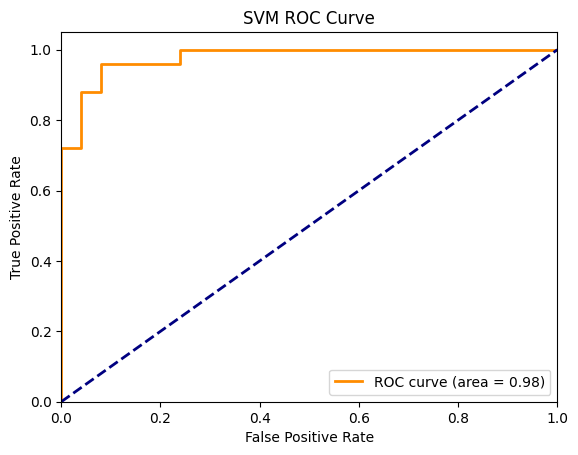

In [75]:
clf = SVC(probability=True)
clf.fit(X_train1, y_train1)

# Train Results
print('-'*10, 'Train Results of SVM', '-'*10)
train_predictions = clf.predict_proba(X_train1)[:, 1]
train_pred = clf.predict(X_train1)
clf_result(y_true=y_train1, predictions=train_predictions, y_pred=train_pred, model_name='SVM')

# Test Results
print('\n\n', '-'*10, 'Test Results  of SVM', '-'*10)
test_predictions = clf.predict_proba(X_test1)[:, 1]
test_pred = clf.predict(X_test1)
clf_result(y_true=y_test1, predictions=test_predictions, y_pred=test_pred, model_name='SVM')

## SVM Classifier - Calibration File 2

---------- Train Results of SVM ----------
SVM Confusion Matrix:
 [[75  0]
 [ 2 73]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.99        75
           1       1.00      0.97      0.99        75

    accuracy                           0.99       150
   macro avg       0.99      0.99      0.99       150
weighted avg       0.99      0.99      0.99       150



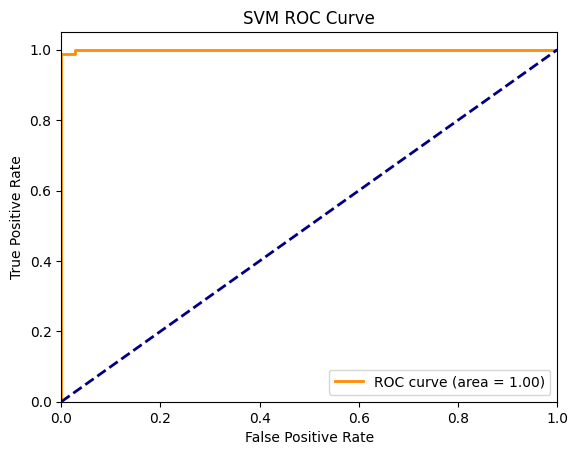



 ---------- Test Results  of SVM ----------
SVM Confusion Matrix:
 [[24  1]
 [ 4 21]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.96      0.91        25
           1       0.95      0.84      0.89        25

    accuracy                           0.90        50
   macro avg       0.91      0.90      0.90        50
weighted avg       0.91      0.90      0.90        50



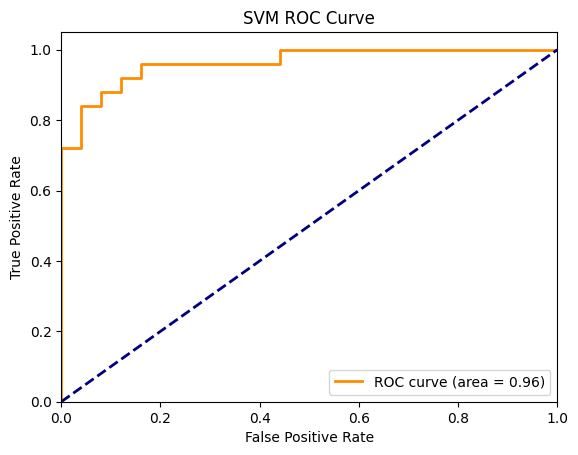

In [76]:
clf = SVC(probability=True)
clf.fit(X_train2, y_train2)

# Train Results
print('-'*10, 'Train Results of SVM', '-'*10)
train_predictions = clf.predict_proba(X_train2)[:, 1]
train_pred = clf.predict(X_train2)
clf_result(y_true=y_train2, predictions=train_predictions, y_pred=train_pred, model_name='SVM')

# Test Results
print('\n\n', '-'*10, 'Test Results  of SVM', '-'*10)
test_predictions = clf.predict_proba(X_test2)[:, 1]
test_pred = clf.predict(X_test2)
clf_result(y_true=y_test2, predictions=test_predictions, y_pred=test_pred, model_name='SVM')

## KNN Classifier - Calibration File 1

---------- Train Results of KNN ----------
KNN Confusion Matrix:
 [[69  6]
 [ 9 66]]
KNN Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.92      0.90        75
           1       0.92      0.88      0.90        75

    accuracy                           0.90       150
   macro avg       0.90      0.90      0.90       150
weighted avg       0.90      0.90      0.90       150



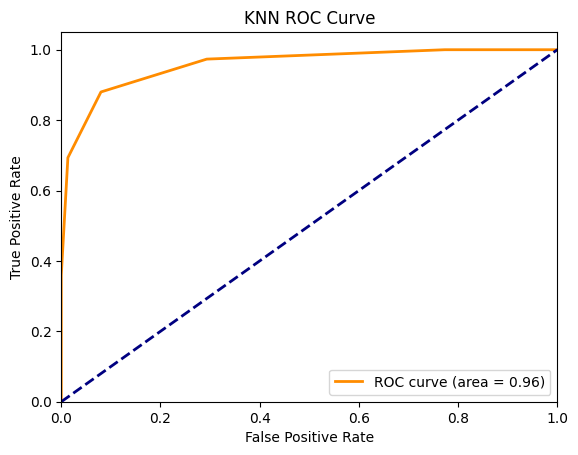



 ---------- Test Results of KNN ----------
KNN Confusion Matrix:
 [[25  0]
 [ 9 16]]
KNN Classification Report:
               precision    recall  f1-score   support

           0       0.74      1.00      0.85        25
           1       1.00      0.64      0.78        25

    accuracy                           0.82        50
   macro avg       0.87      0.82      0.81        50
weighted avg       0.87      0.82      0.81        50



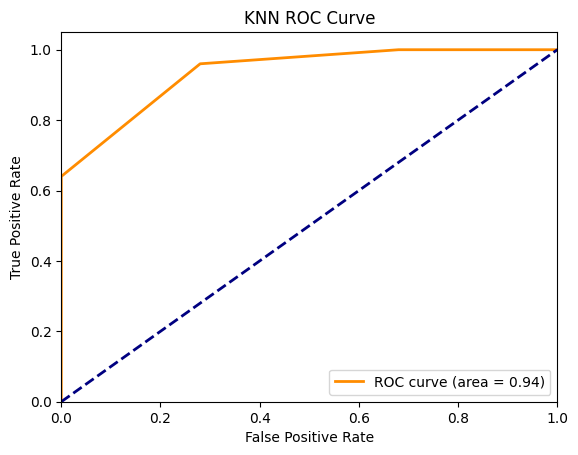

In [77]:
clf = KNeighborsClassifier()
clf.fit(X_train1, y_train1)

# Train Results
print('-'*10, 'Train Results of KNN', '-'*10)
train_predictions = clf.predict_proba(X_train1)[:, 1]
train_pred = clf.predict(X_train1)
clf_result(y_true=y_train1, predictions=train_predictions, y_pred=train_pred, model_name='KNN')

# Test Results
print('\n\n', '-'*10, 'Test Results of KNN', '-'*10)
test_predictions = clf.predict_proba(X_test1)[:, 1]
test_pred = clf.predict(X_test1)
clf_result(y_true=y_test1, predictions=test_predictions, y_pred=test_pred, model_name='KNN')

## KNN Classifier - Calibration File 2

---------- Train Results of SVM ----------
SVM Confusion Matrix:
 [[70  5]
 [ 9 66]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.93      0.91        75
           1       0.93      0.88      0.90        75

    accuracy                           0.91       150
   macro avg       0.91      0.91      0.91       150
weighted avg       0.91      0.91      0.91       150



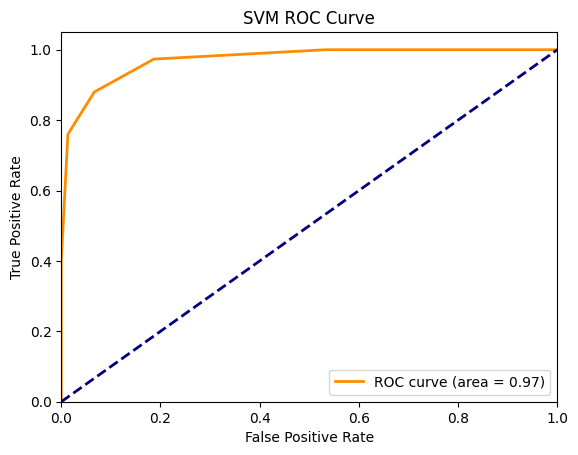



 ---------- Test Results  of SVM ----------
SVM Confusion Matrix:
 [[23  2]
 [ 4 21]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.92      0.88        25
           1       0.91      0.84      0.87        25

    accuracy                           0.88        50
   macro avg       0.88      0.88      0.88        50
weighted avg       0.88      0.88      0.88        50



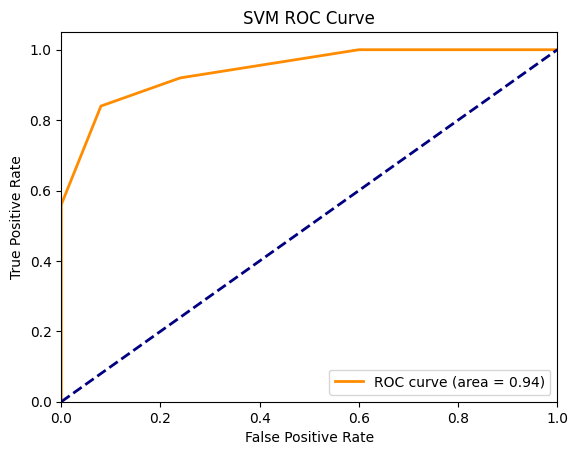

In [78]:
clf = KNeighborsClassifier()
clf.fit(X_train2, y_train2)

# Train Results
print('-'*10, 'Train Results of SVM', '-'*10)
train_predictions = clf.predict_proba(X_train2)[:, 1]
train_pred = clf.predict(X_train2)
clf_result(y_true=y_train2, predictions=train_predictions, y_pred=train_pred, model_name='SVM')

# Test Results
print('\n\n', '-'*10, 'Test Results  of SVM', '-'*10)
test_predictions = clf.predict_proba(X_test2)[:, 1]
test_pred = clf.predict(X_test2)
clf_result(y_true=y_test2, predictions=test_predictions, y_pred=test_pred, model_name='SVM')

## Logistic Regression Classifier - Calibration File 1

---------- Train Results of Logistic Regression ----------
Logistic Regression Confusion Matrix:
 [[73  2]
 [ 2 73]]
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97        75
           1       0.97      0.97      0.97        75

    accuracy                           0.97       150
   macro avg       0.97      0.97      0.97       150
weighted avg       0.97      0.97      0.97       150



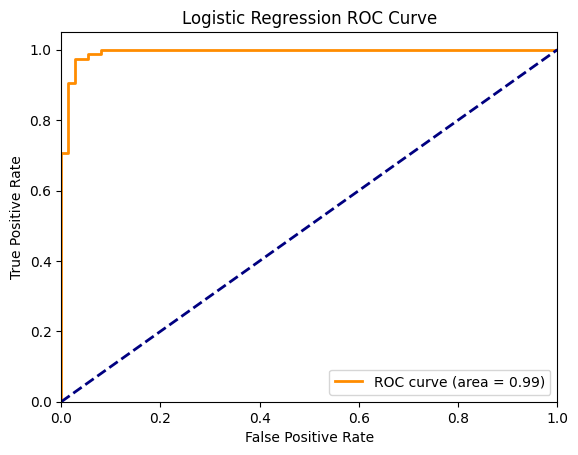



 ---------- Test Results of Logistic Regression ----------
Logistic Regression Confusion Matrix:
 [[24  1]
 [ 2 23]]
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.96      0.94        25
           1       0.96      0.92      0.94        25

    accuracy                           0.94        50
   macro avg       0.94      0.94      0.94        50
weighted avg       0.94      0.94      0.94        50



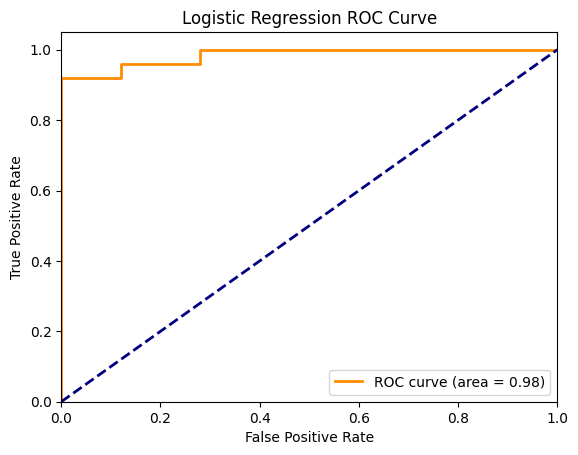

In [79]:
clf = LogisticRegression()
clf.fit(X_train1, y_train1)

# Train Results
print('-'*10, 'Train Results of Logistic Regression', '-'*10)
train_predictions = clf.predict_proba(X_train1)[:, 1]
train_pred = clf.predict(X_train1)
clf_result(y_true=y_train1, predictions=train_predictions, y_pred=train_pred, model_name='Logistic Regression')

# Test Results
print('\n\n', '-'*10, 'Test Results of Logistic Regression', '-'*10)
test_predictions = clf.predict_proba(X_test1)[:, 1]
test_pred = clf.predict(X_test1)
clf_result(y_true=y_test1, predictions=test_predictions, y_pred=test_pred, model_name='Logistic Regression')

## Logistic Regression Classifier - Calibration File 2

---------- Train Results of SVM ----------
SVM Confusion Matrix:
 [[75  0]
 [ 0 75]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        75

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150



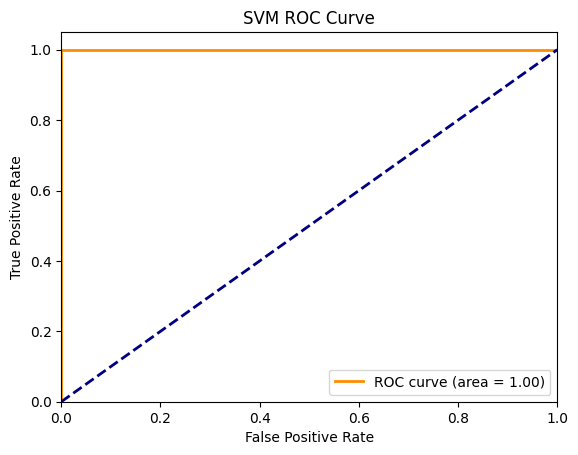



 ---------- Test Results  of SVM ----------
SVM Confusion Matrix:
 [[24  1]
 [ 4 21]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.96      0.91        25
           1       0.95      0.84      0.89        25

    accuracy                           0.90        50
   macro avg       0.91      0.90      0.90        50
weighted avg       0.91      0.90      0.90        50



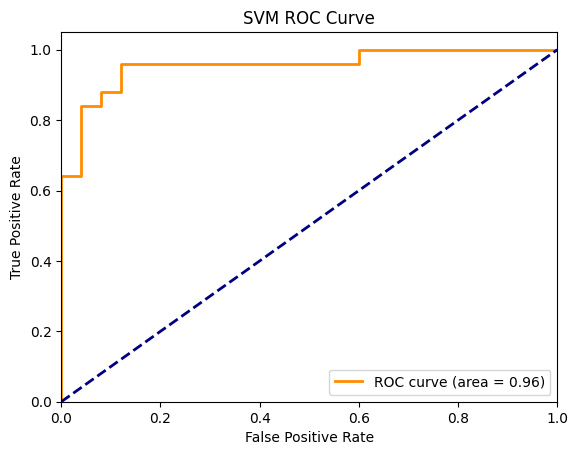

In [80]:
clf = LogisticRegression()
clf.fit(X_train2, y_train2)

# Train Results
print('-'*10, 'Train Results of SVM', '-'*10)
train_predictions = clf.predict_proba(X_train2)[:, 1]
train_pred = clf.predict(X_train2)
clf_result(y_true=y_train2, predictions=train_predictions, y_pred=train_pred, model_name='SVM')

# Test Results
print('\n\n', '-'*10, 'Test Results  of SVM', '-'*10)
test_predictions = clf.predict_proba(X_test2)[:, 1]
test_pred = clf.predict(X_test2)
clf_result(y_true=y_test2, predictions=test_predictions, y_pred=test_pred, model_name='SVM')

## AdaBoost Classifier - Calibration File 1

---------- Train Results of AdaBoost ----------
AdaBoost Confusion Matrix:
 [[75  0]
 [ 0 75]]
AdaBoost Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        75

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150



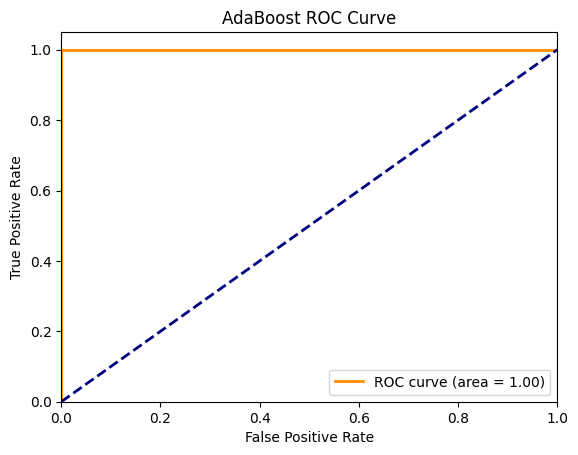



 ---------- Test Results of AdaBoost ----------
AdaBoost Confusion Matrix:
 [[24  1]
 [ 3 22]]
AdaBoost Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.96      0.92        25
           1       0.96      0.88      0.92        25

    accuracy                           0.92        50
   macro avg       0.92      0.92      0.92        50
weighted avg       0.92      0.92      0.92        50



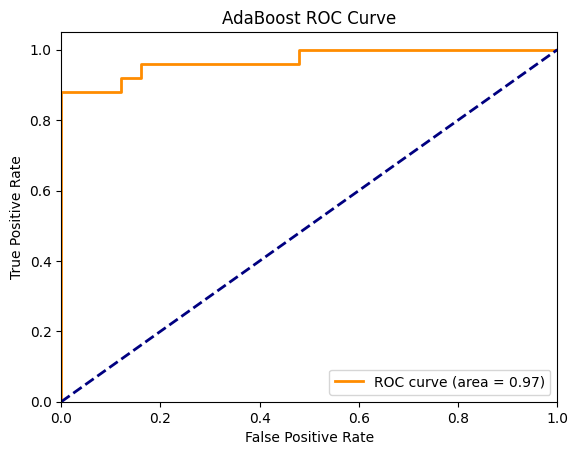

In [81]:
clf = AdaBoostClassifier()
clf.fit(X_train1, y_train1)

# Train Results
print('-'*10, 'Train Results of AdaBoost', '-'*10)
train_predictions = clf.predict_proba(X_train1)[:, 1]
train_pred = clf.predict(X_train1)
clf_result(y_true=y_train1, predictions=train_predictions, y_pred=train_pred, model_name='AdaBoost')

# Test Results
print('\n\n', '-'*10, 'Test Results of AdaBoost', '-'*10)
test_predictions = clf.predict_proba(X_test1)[:, 1]
test_pred = clf.predict(X_test1)
clf_result(y_true=y_test1, predictions=test_predictions, y_pred=test_pred, model_name='AdaBoost')

## AdaBoost Classifier - Calibration File 2

---------- Train Results of SVM ----------
SVM Confusion Matrix:
 [[75  0]
 [ 0 75]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        75

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150



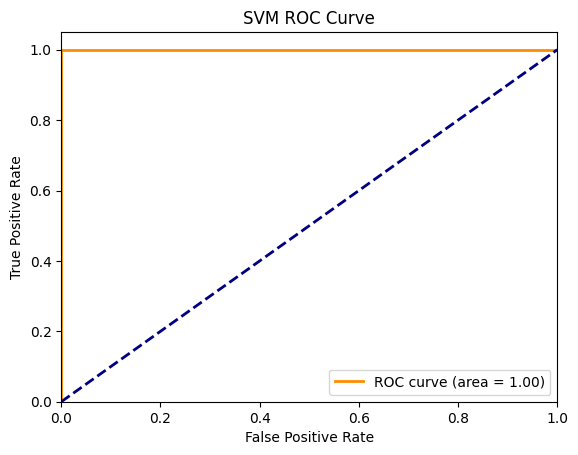



 ---------- Test Results  of SVM ----------
SVM Confusion Matrix:
 [[23  2]
 [ 3 22]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.92      0.90        25
           1       0.92      0.88      0.90        25

    accuracy                           0.90        50
   macro avg       0.90      0.90      0.90        50
weighted avg       0.90      0.90      0.90        50



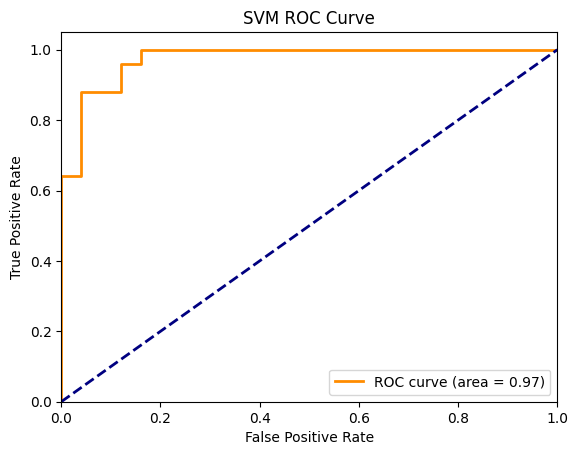

In [82]:
clf = AdaBoostClassifier()
clf.fit(X_train2, y_train2)

# Train Results
print('-'*10, 'Train Results of SVM', '-'*10)
train_predictions = clf.predict_proba(X_train2)[:, 1]
train_pred = clf.predict(X_train2)
clf_result(y_true=y_train2, predictions=train_predictions, y_pred=train_pred, model_name='SVM')

# Test Results
print('\n\n', '-'*10, 'Test Results  of SVM', '-'*10)
test_predictions = clf.predict_proba(X_test2)[:, 1]
test_pred = clf.predict(X_test2)
clf_result(y_true=y_test2, predictions=test_predictions, y_pred=test_pred, model_name='SVM')

## MLP Classifier - Calibration File 1

---------- Train Results of MLP ----------
MLP Confusion Matrix:
 [[75  0]
 [ 0 75]]
MLP Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        75

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150



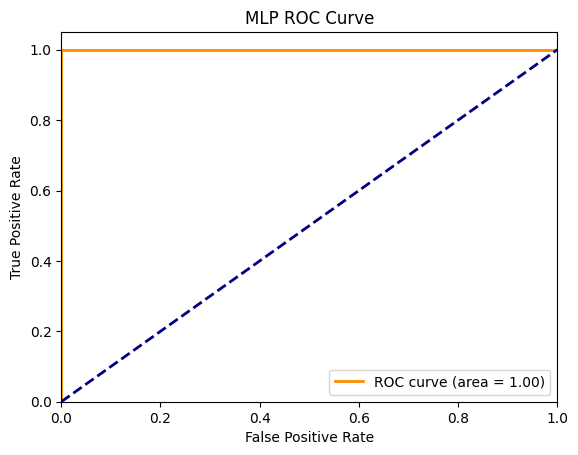



 ---------- Test Results of MLP ----------
MLP Confusion Matrix:
 [[23  2]
 [ 3 22]]
MLP Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.92      0.90        25
           1       0.92      0.88      0.90        25

    accuracy                           0.90        50
   macro avg       0.90      0.90      0.90        50
weighted avg       0.90      0.90      0.90        50



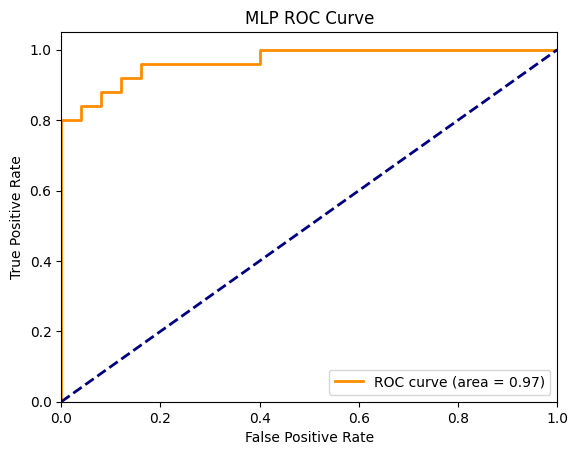

In [83]:
clf = MLPClassifier(max_iter=500)
clf.fit(X_train1, y_train1)

# Train Results
print('-'*10, 'Train Results of MLP', '-'*10)
train_predictions = clf.predict_proba(X_train1)[:, 1]
train_pred = clf.predict(X_train1)
clf_result(y_true=y_train1, predictions=train_predictions, y_pred=train_pred, model_name='MLP')

# Test Results
print('\n\n', '-'*10, 'Test Results of MLP', '-'*10)
test_predictions = clf.predict_proba(X_test1)[:, 1]
test_pred = clf.predict(X_test1)
clf_result(y_true=y_test1, predictions=test_predictions, y_pred=test_pred, model_name='MLP')

## MLP Classifier - Calibration File 2

---------- Train Results of SVM ----------
SVM Confusion Matrix:
 [[75  0]
 [ 0 75]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        75

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150



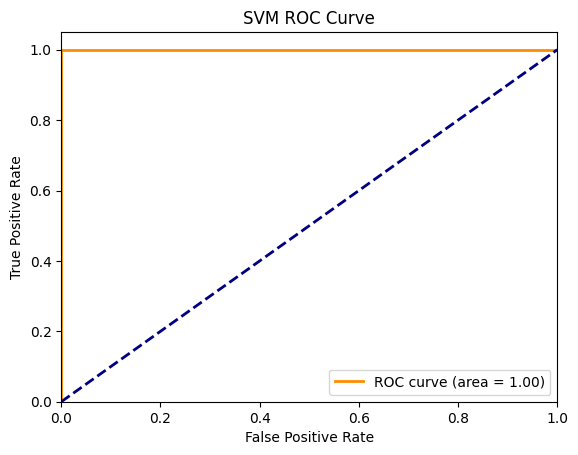



 ---------- Test Results  of SVM ----------
SVM Confusion Matrix:
 [[25  0]
 [ 4 21]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.86      1.00      0.93        25
           1       1.00      0.84      0.91        25

    accuracy                           0.92        50
   macro avg       0.93      0.92      0.92        50
weighted avg       0.93      0.92      0.92        50



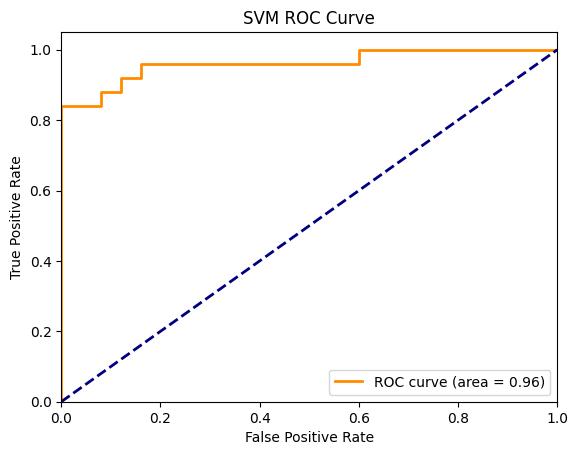

In [84]:
clf = MLPClassifier(max_iter=500)
clf.fit(X_train2, y_train2)

# Train Results
print('-'*10, 'Train Results of SVM', '-'*10)
train_predictions = clf.predict_proba(X_train2)[:, 1]
train_pred = clf.predict(X_train2)
clf_result(y_true=y_train2, predictions=train_predictions, y_pred=train_pred, model_name='SVM')

# Test Results
print('\n\n', '-'*10, 'Test Results  of SVM', '-'*10)
test_predictions = clf.predict_proba(X_test2)[:, 1]
test_pred = clf.predict(X_test2)
clf_result(y_true=y_test2, predictions=test_predictions, y_pred=test_pred, model_name='SVM')

# XGBoost - Calibration File 1

---------- Train Results of XGBoost ----------
XGBoost Confusion Matrix:
 [[75  0]
 [ 0 75]]
XGBoost Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        75

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150



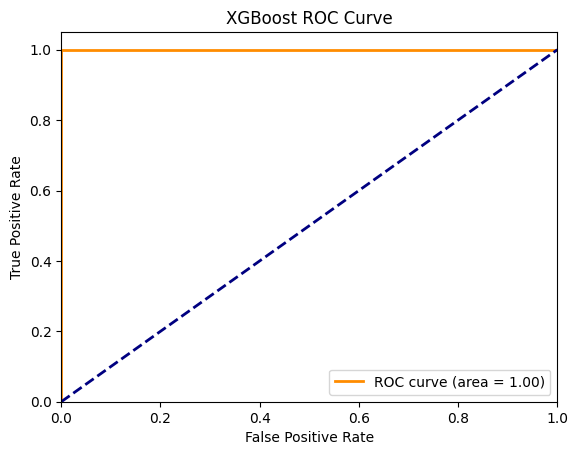



 ---------- Test Results of XGBoost ----------
XGBoost Confusion Matrix:
 [[22  3]
 [ 5 20]]
XGBoost Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.88      0.85        25
           1       0.87      0.80      0.83        25

    accuracy                           0.84        50
   macro avg       0.84      0.84      0.84        50
weighted avg       0.84      0.84      0.84        50



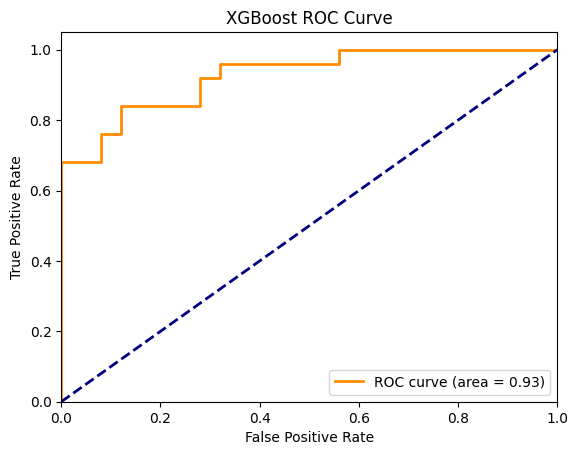

In [85]:
clf = XGBClassifier()
clf.fit(X_train1, y_train1)

# Train Results
print('-'*10, 'Train Results of XGBoost', '-'*10)
train_predictions = clf.predict_proba(X_train1)[:, 1]
train_pred = clf.predict(X_train1)
clf_result(y_true=y_train1, predictions=train_predictions, y_pred=train_pred, model_name='XGBoost')

# Test Results
print('\n\n', '-'*10, 'Test Results of XGBoost', '-'*10)
test_predictions = clf.predict_proba(X_test1)[:, 1]
test_pred = clf.predict(X_test1)
clf_result(y_true=y_test1, predictions=test_predictions, y_pred=test_pred, model_name='XGBoost')

# XGBoost - Calibration File 2

---------- Train Results of SVM ----------
SVM Confusion Matrix:
 [[75  0]
 [ 0 75]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        75

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150



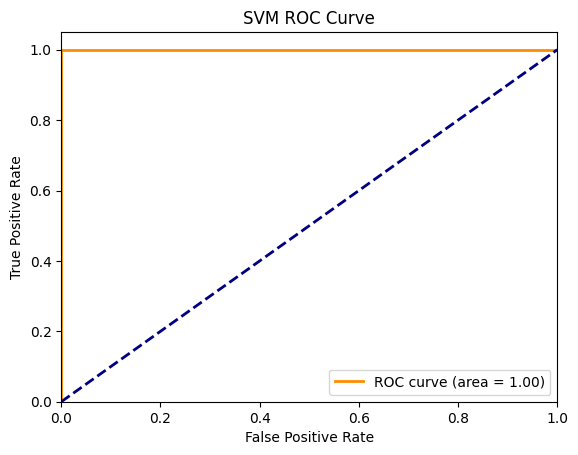



 ---------- Test Results  of SVM ----------
SVM Confusion Matrix:
 [[22  3]
 [ 3 22]]
SVM Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.88      0.88        25
           1       0.88      0.88      0.88        25

    accuracy                           0.88        50
   macro avg       0.88      0.88      0.88        50
weighted avg       0.88      0.88      0.88        50



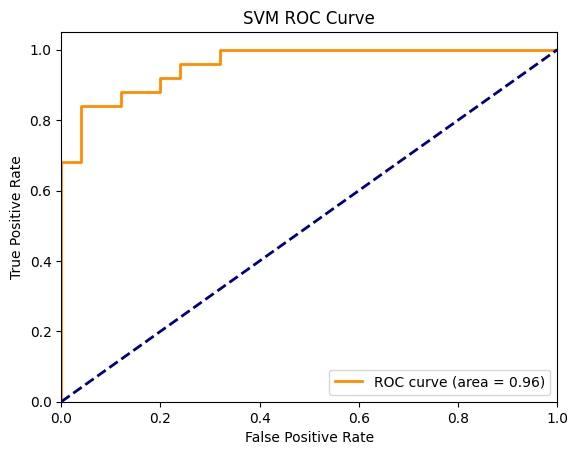

In [86]:
clf = XGBClassifier()
clf.fit(X_train2, y_train2)

# Train Results
print('-'*10, 'Train Results of SVM', '-'*10)
train_predictions = clf.predict_proba(X_train2)[:, 1]
train_pred = clf.predict(X_train2)
clf_result(y_true=y_train2, predictions=train_predictions, y_pred=train_pred, model_name='SVM')

# Test Results
print('\n\n', '-'*10, 'Test Results  of SVM', '-'*10)
test_predictions = clf.predict_proba(X_test2)[:, 1]
test_pred = clf.predict(X_test2)
clf_result(y_true=y_test2, predictions=test_predictions, y_pred=test_pred, model_name='SVM')

# Clustering - Calibration File 1

## Optimal Number of Clusters Using Silhouette Score

In [87]:
range_n_clusters = list(range(2, 10))
kmeans_silhouette_scores = []
agg_silhouette_scores = []

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    kmeans_labels = kmeans.fit_predict(X_csp1)
    kmeans_silhouette_scores.append(silhouette_score(X_csp1, kmeans_labels))
    
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    agg_labels = agg_clustering.fit_predict(X_csp1)
    agg_silhouette_scores.append(silhouette_score(X_csp1, agg_labels))

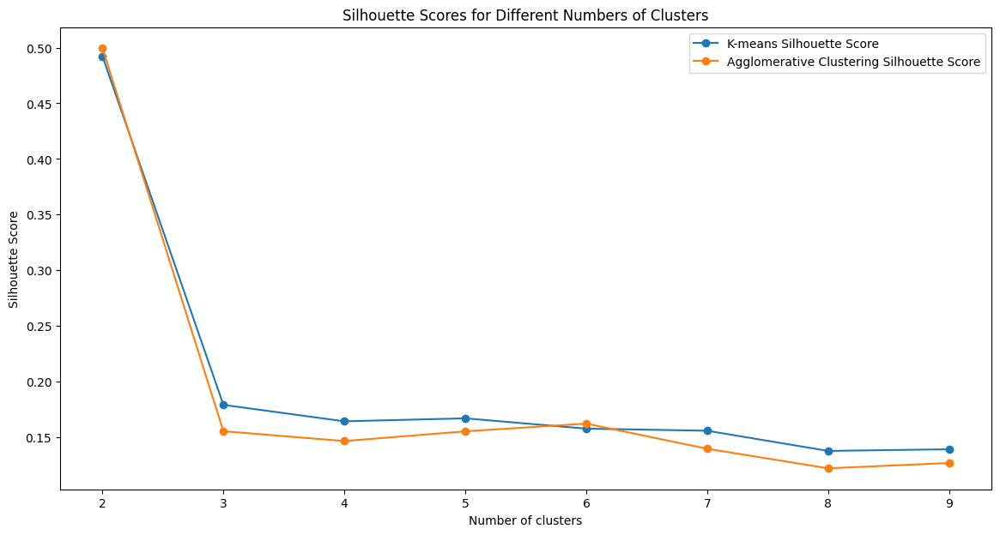

In [88]:
plt.figure(figsize=(14, 7))
plt.plot(range_n_clusters, kmeans_silhouette_scores, label='K-means Silhouette Score', marker='o')
plt.plot(range_n_clusters, agg_silhouette_scores, label='Agglomerative Clustering Silhouette Score', marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.title('Silhouette Scores for Different Numbers of Clusters')
plt.show()

## K-means Clustering 

In [89]:
optimal_n_clusters = 2  
kmeans = KMeans(n_clusters=optimal_n_clusters, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(X_csp1)

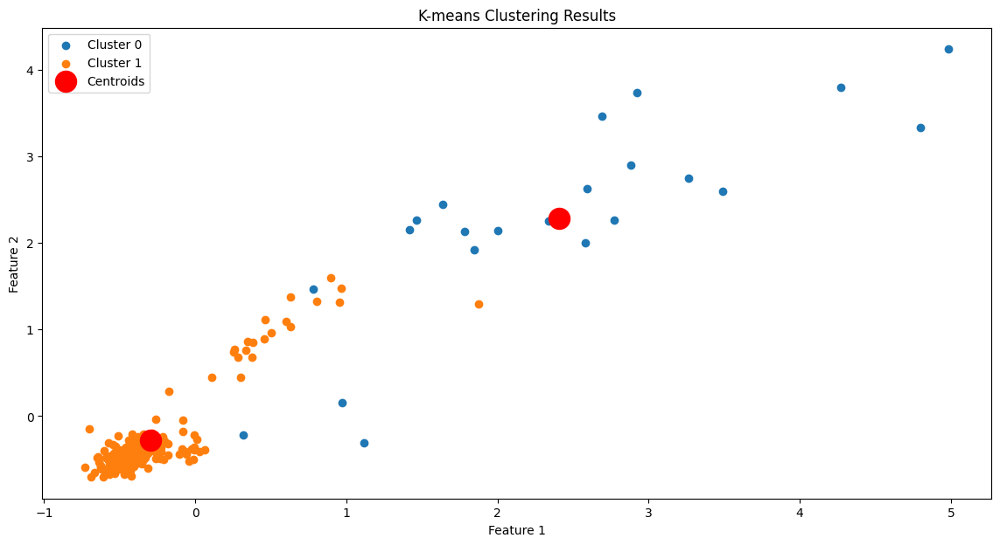

In [90]:
plt.figure(figsize=(14, 7))
for cluster in np.unique(kmeans_labels):
    plt.scatter(X_csp1[kmeans_labels == cluster, 0], 
                X_csp1[kmeans_labels == cluster, 1], 
                label=f'Cluster {cluster}')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            s=300, c='red', label='Centroids')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('K-means Clustering Results')
plt.legend()
plt.show()

## Agglomerative Clustering

In [91]:
agg_clustering = AgglomerativeClustering(n_clusters=optimal_n_clusters)
agg_labels = agg_clustering.fit_predict(X_csp1)

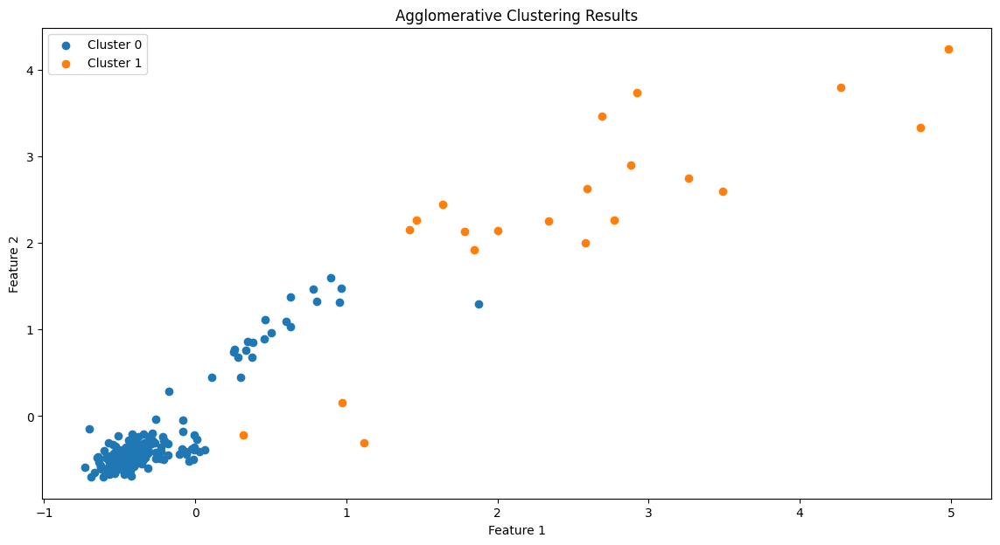

In [92]:
plt.figure(figsize=(14, 7))
for cluster in np.unique(agg_labels):
    plt.scatter(X_csp1[agg_labels == cluster, 0], 
                X_csp1[agg_labels == cluster, 1], 
                label=f'Cluster {cluster}')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Agglomerative Clustering Results')
plt.legend()
plt.show()

### Silhouette Score

In [93]:
kmeans_silhouette_avg = silhouette_score(X_csp1, kmeans_labels)
agg_silhouette_avg = silhouette_score(X_csp1, agg_labels)

print(f'K-means Silhouette Score: {kmeans_silhouette_avg}')
print(f'Agglomerative Clustering Silhouette Score: {agg_silhouette_avg}')

K-means Silhouette Score: 0.4923140708643595
Agglomerative Clustering Silhouette Score: 0.49951597536735903


###  Davies-Bouldin Index

In [94]:
kmeans_db_score = davies_bouldin_score(X_csp1, kmeans_labels)
agg_db_score = davies_bouldin_score(X_csp1, agg_labels)

print(f'K-means Davies-Bouldin Index: {kmeans_db_score}')
print(f'Agglomerative Clustering Davies-Bouldin Index: {agg_db_score}')

K-means Davies-Bouldin Index: 1.0172810382731274
Agglomerative Clustering Davies-Bouldin Index: 1.0007512452950422


### Calinski-Harabasz Index

In [95]:
kmeans_ch_score = calinski_harabasz_score(X_csp1, kmeans_labels)
agg_ch_score = calinski_harabasz_score(X_csp1, agg_labels)

print(f'K-means Calinski-Harabasz Index: {kmeans_ch_score}')
print(f'Agglomerative Clustering Calinski-Harabasz Index: {agg_ch_score}')

K-means Calinski-Harabasz Index: 95.61877741547181
Agglomerative Clustering Calinski-Harabasz Index: 95.23357157841157


# Clustering - Calibration File 2

## Optimal Number of Clusters Using Silhouette Score

In [96]:
range_n_clusters = list(range(2, 10))
kmeans_silhouette_scores = []
agg_silhouette_scores = []

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    kmeans_labels = kmeans.fit_predict(X_csp2)
    kmeans_silhouette_scores.append(silhouette_score(X_csp2, kmeans_labels))
    
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    agg_labels = agg_clustering.fit_predict(X_csp2)
    agg_silhouette_scores.append(silhouette_score(X_csp2, agg_labels))

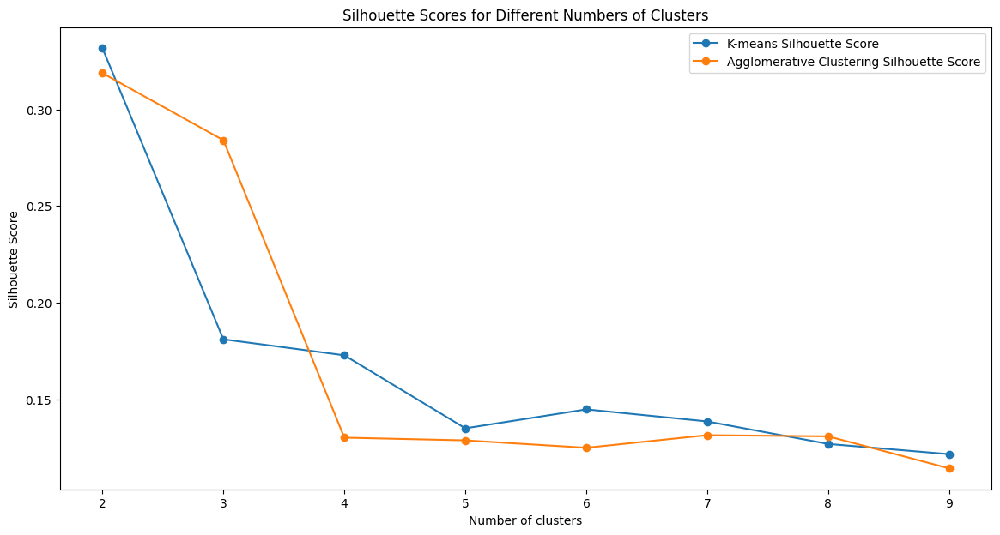

In [97]:
plt.figure(figsize=(14, 7))
plt.plot(range_n_clusters, kmeans_silhouette_scores, label='K-means Silhouette Score', marker='o')
plt.plot(range_n_clusters, agg_silhouette_scores, label='Agglomerative Clustering Silhouette Score', marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.title('Silhouette Scores for Different Numbers of Clusters')
plt.show()

## K-means Clustering 

In [98]:
optimal_n_clusters = 2  
kmeans = KMeans(n_clusters=optimal_n_clusters, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(X_csp2)

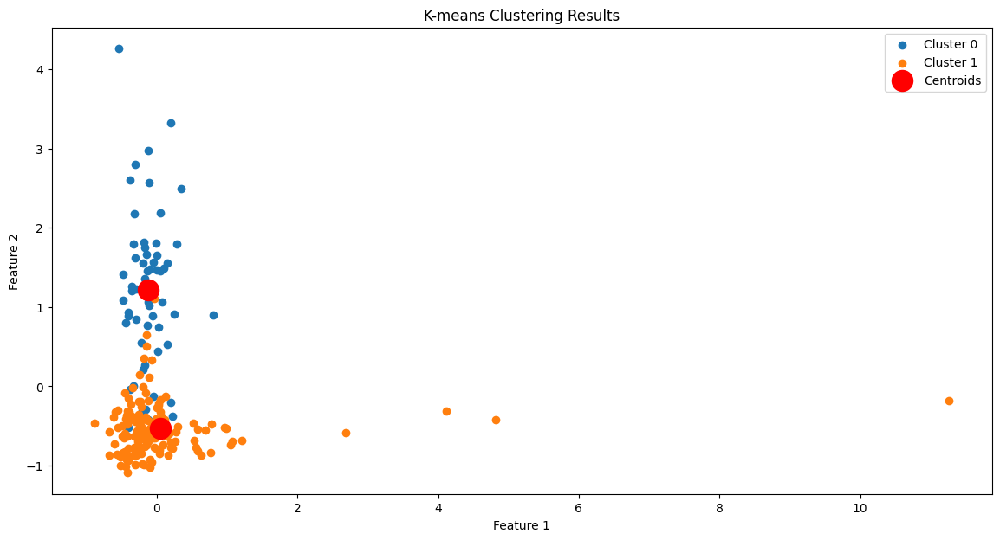

In [99]:
plt.figure(figsize=(14, 7))
for cluster in np.unique(kmeans_labels):
    plt.scatter(X_csp2[kmeans_labels == cluster, 0], 
                X_csp2[kmeans_labels == cluster, 1], 
                label=f'Cluster {cluster}')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            s=300, c='red', label='Centroids')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('K-means Clustering Results')
plt.legend()
plt.show()

## Agglomerative Clustering

In [100]:
agg_clustering = AgglomerativeClustering(n_clusters=optimal_n_clusters)
agg_labels = agg_clustering.fit_predict(X_csp2)

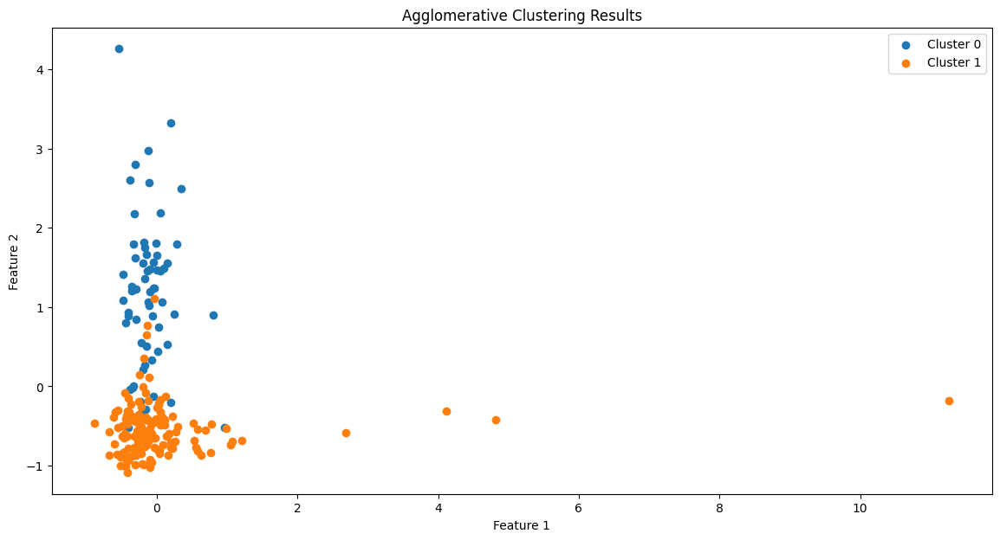

In [101]:
plt.figure(figsize=(14, 7))
for cluster in np.unique(agg_labels):
    plt.scatter(X_csp2[agg_labels == cluster, 0], 
                X_csp2[agg_labels == cluster, 1], 
                label=f'Cluster {cluster}')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Agglomerative Clustering Results')
plt.legend()
plt.show()

### Silhouette Score

In [102]:
kmeans_silhouette_avg = silhouette_score(X_csp2, kmeans_labels)
agg_silhouette_avg = silhouette_score(X_csp2, agg_labels)

print(f'K-means Silhouette Score: {kmeans_silhouette_avg}')
print(f'Agglomerative Clustering Silhouette Score: {agg_silhouette_avg}')

K-means Silhouette Score: 0.3316369855148721
Agglomerative Clustering Silhouette Score: 0.318747509617518


###  Davies-Bouldin Index

In [103]:
kmeans_db_score = davies_bouldin_score(X_csp2, kmeans_labels)
agg_db_score = davies_bouldin_score(X_csp2, agg_labels)

print(f'K-means Davies-Bouldin Index: {kmeans_db_score}')
print(f'Agglomerative Clustering Davies-Bouldin Index: {agg_db_score}')

K-means Davies-Bouldin Index: 1.2633621634145293
Agglomerative Clustering Davies-Bouldin Index: 1.3234728492800305


### Calinski-Harabasz Index

In [104]:
kmeans_ch_score = calinski_harabasz_score(X_csp2, kmeans_labels)
agg_ch_score = calinski_harabasz_score(X_csp2, agg_labels)

print(f'K-means Calinski-Harabasz Index: {kmeans_ch_score}')
print(f'Agglomerative Clustering Calinski-Harabasz Index: {agg_ch_score}')

K-means Calinski-Harabasz Index: 105.23023274553904
Agglomerative Clustering Calinski-Harabasz Index: 97.81815093309896
